Imports

In [60]:
import os
import time
import mne_connectivity
import numpy as np
import mne
import matplotlib
import matplotlib.pyplot as plt
import networkx as nx

Ensure Matplotlib uses the Qt5Agg backend for plotting functions

In [61]:
#  matplotlib.use('Qt5Agg')
annot_kwargs = dict(fontsize=12, fontweight='bold',
                    xycoords="axes fraction", ha='right', va='center')
fontsize = 8
params = {'font.size': fontsize,
          'axes.labelsize': fontsize,
          'legend.fontsize': fontsize,
          'xtick.labelsize': fontsize,
          'ytick.labelsize': fontsize,
          'axes.titlesize': fontsize + 2,
          'figure.max_open_warning': 200,
          'axes.spines.top': False,
          'axes.spines.right': False,
          'axes.grid': True,
          'lines.linewidth': 1
          }
plt.rcParams.update(params)

Configure to use Cuda

In [62]:
try:
    mne.set_config('MNE_USE_CUDA', 'true')
except TypeError as err:
    print(err)

Choose channels from the raw edf file to use

In [63]:
# good channels: [4,5,6,7,8,9,10,11,12,13,14,15,16,17]
# all channels ['TIME_STAMP_s', 'TIME_STAMP_ms', 'COUNTER', 'INTERPOLATED', 'AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4', 'HighBitFlex', 'SaturationFlag', 'RAW_CQ', 'BATTERY', 'BATTERY_PERCENT', 'MarkerIndex', 'MarkerType', 'MarkerValueInt', 'MARKER_HARDWARE', 'CQ_AF3', 'CQ_F7', 'CQ_F3', 'CQ_FC5', 'CQ_T7', 'CQ_P7', 'CQ_O1', 'CQ_O2', 'CQ_P8', 'CQ_T8', 'CQ_FC6', 'CQ_F4', 'CQ_F8', 'CQ_AF4', 'CQ_OVERALL', 'EQ_SampleRateQua', 'EQ_OVERALL', 'EQ_AF3', 'EQ_F7', 'EQ_F3', 'EQ_FC5', 'EQ_T7', 'EQ_P7', 'EQ_O1', 'EQ_O2', 'EQ_P8', 'EQ_T8', 'EQ_FC6', 'EQ_F4', 'EQ_F8', 'EQ_AF4', 'CQ_CMS', 'CQ_DRL']
stim_channels = ['MarkerValueInt', 'MarkerType']
exclude = ['MARKER_HARDWARE', 'MarkerIndex', 'TIME_STAMP_s', 'TIME_STAMP_ms', 'COUNTER', 'INTERPOLATED', 'HighBitFlex', 'SaturationFlag', 'RAW_CQ', 'BATTERY', 'BATTERY_PERCENT', 'CQ_AF3', 'CQ_F7', 'CQ_F3', 'CQ_FC5', 'CQ_T7', 'CQ_P7', 'CQ_O1', 'CQ_O2', 'CQ_P8', 'CQ_T8', 'CQ_FC6', 'CQ_F4', 'CQ_F8', 'CQ_AF4', 'CQ_OVERALL', 'EQ_SampleRateQua', 'EQ_OVERALL', 'EQ_AF3', 'EQ_F7', 'EQ_F3', 'EQ_FC5', 'EQ_T7', 'EQ_P7', 'EQ_O1', 'EQ_O2', 'EQ_P8', 'EQ_T8', 'EQ_FC6', 'EQ_F4', 'EQ_F8', 'EQ_AF4', 'CQ_CMS', 'CQ_DRL']
#  eog_channels = ['AF3', 'AF4']

Import EDFs

In [64]:
#  edf file name here
import_folder = 'Patrick and Josh Trial 3'
edf_file_name1 = 'EEG-Game_Josh Schrock_EPOCFLEX-F0000172_EPOCFLEX_123045_2022.08.05T14.35.40.04.00'
data_raw_file1 = f"{os.getcwd()}\\BCI Modified Chicken\\EEGExports\\{import_folder}\\{edf_file_name1}.edf"
raw1 = mne.io.read_raw_edf(data_raw_file1, stim_channel=stim_channels, exclude=exclude, preload=True)

edf_file_name2 = 'EEG-Game_Patrick_EPOCFLEX-F000015B_EPOCFLEX_123045_2022.08.05T14.35.40.04.00'
data_raw_file2 = f"{os.getcwd()}\\BCI Modified Chicken\\EEGExports\\{import_folder}\\{edf_file_name2}.edf"
raw2 = mne.io.read_raw_edf(data_raw_file2, stim_channel=stim_channels, exclude=exclude, preload=True)

Extracting EDF parameters from D:\Pycharm Projects\EEG-Game-V2\BCI Modified Chicken\EEGExports\Patrick and Josh Trial 3\EEG-Game_Josh Schrock_EPOCFLEX-F0000172_EPOCFLEX_123045_2022.08.05T14.35.40.04.00.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 65151  =      0.000 ...   508.992 secs...
Extracting EDF parameters from D:\Pycharm Projects\EEG-Game-V2\BCI Modified Chicken\EEGExports\Patrick and Josh Trial 3\EEG-Game_Patrick_EPOCFLEX-F000015B_EPOCFLEX_123045_2022.08.05T14.35.40.04.00.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 65151  =      0.000 ...   508.992 secs...


Set up the montage for this data

In [65]:
# Form the 10-20 montage
mont1020 = mne.channels.make_standard_montage('standard_1020')
# Choose what channels you want to keep
# Make sure that these channels exist e.g. T1 does not exist in the standard 10-20 EEG system!
kept_channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
ind = [i for (i, channel) in enumerate(mont1020.ch_names) if channel in kept_channels]
mont1020_new = mont1020.copy()
# Keep only the desired channels
mont1020_new.ch_names = [mont1020.ch_names[x] for x in ind]
kept_channel_info = [mont1020.dig[x+3] for x in ind]
# Keep the first three rows as they are the fiducial points information
mont1020_new.dig = mont1020.dig[0:3]+kept_channel_info

Apply montage to the raw data and plot

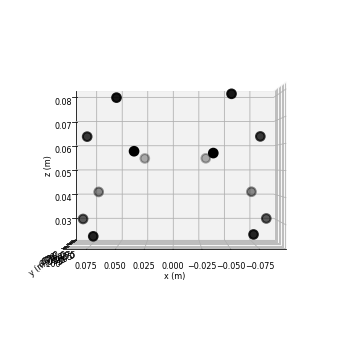

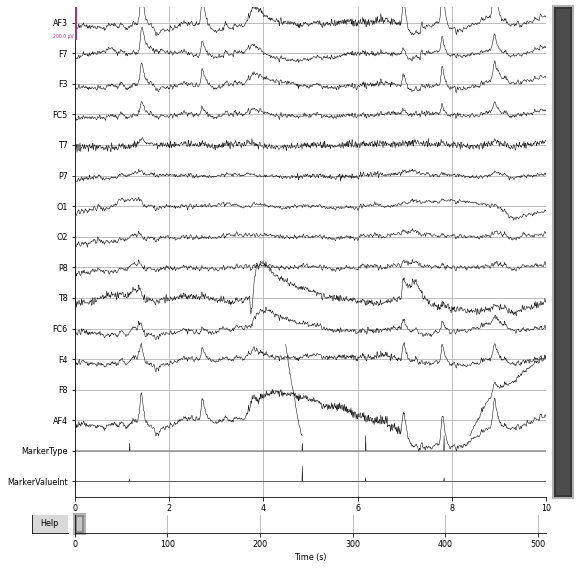

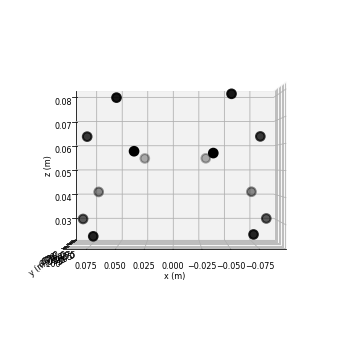

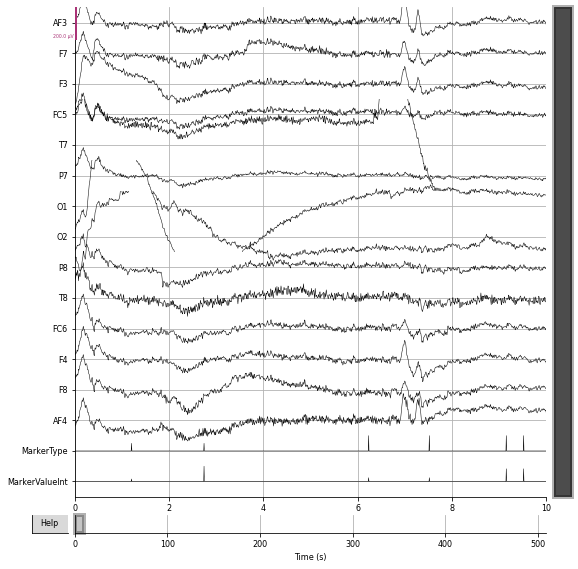

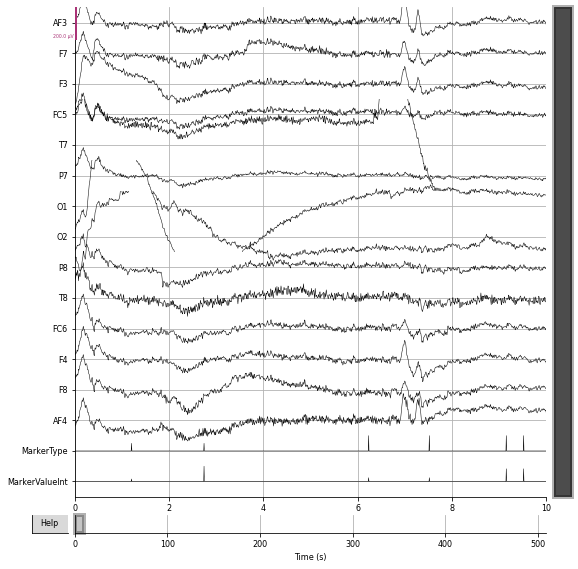

In [66]:
raw1.set_montage(mont1020_new)
raw1.plot_sensors(kind='3d', ch_type='eeg')
raw1.plot(scalings=0.0001)

raw2.set_montage(mont1020_new)
raw2.plot_sensors(kind='3d', ch_type='eeg')
raw2.plot(scalings=0.0001)

Preprocess Data

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 42 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 42.00 Hz
- Upper transition bandwidth: 10.50 Hz (-6 dB cutoff frequency: 47.25 Hz)
- Filter length: 845 samples (6.602 sec)

Effective window size : 16.000 (s)
Effective window size : 16.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\Joshu\PycharmProjects\venv\lib\site-packages\IPython\core\

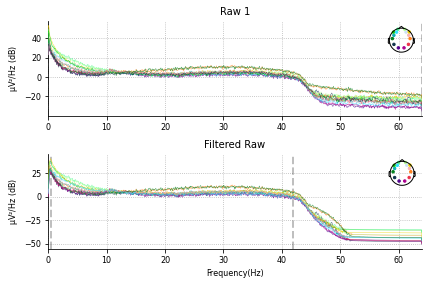

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 42 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 42.00 Hz
- Upper transition bandwidth: 10.50 Hz (-6 dB cutoff frequency: 47.25 Hz)
- Filter length: 845 samples (6.602 sec)

Effective window size : 16.000 (s)
Effective window size : 16.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


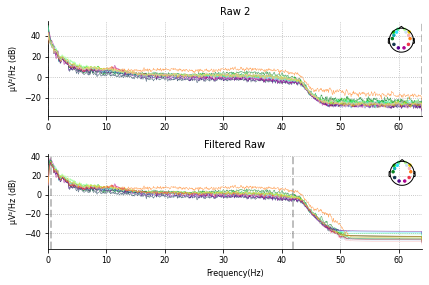

In [67]:
filtered_raw1 = raw1.copy().filter(
    0.5, 42, l_trans_bandwidth='auto', h_trans_bandwidth='auto',
    filter_length='auto', phase='zero', fir_window='hamming',
    fir_design='firwin')
fig, ax = plt.subplots(2)
raw1.plot_psd(ax=ax[0], show=False)
filtered_raw1.plot_psd(ax=ax[1], show=False)
ax[0].set_title('Raw 1')
ax[1].set_title('Filtered Raw')
ax[1].set_xlabel('Frequency(Hz)')
fig.set_tight_layout(True)
plt.show()

filtered_raw2 = raw2.copy().filter(
    0.5, 42, l_trans_bandwidth='auto', h_trans_bandwidth='auto',
    filter_length='auto', phase='zero', fir_window='hamming',
    fir_design='firwin')
fig, ax = plt.subplots(2)
raw2.plot_psd(ax=ax[0], show=False)
filtered_raw2.plot_psd(ax=ax[1], show=False)
ax[0].set_title('Raw 2')
ax[1].set_title('Filtered Raw')
ax[1].set_xlabel('Frequency(Hz)')
fig.set_tight_layout(True)
plt.show()

Perform ICA preprocessing

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components
Fitting ICA took 0.9s.


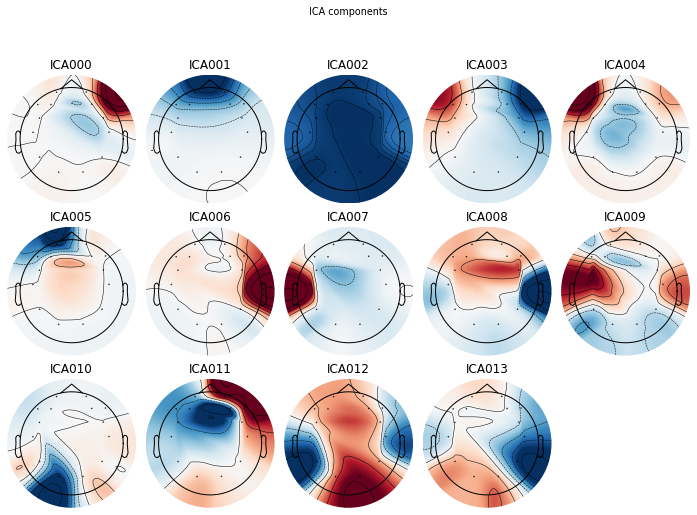

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components
Fitting ICA took 0.7s.


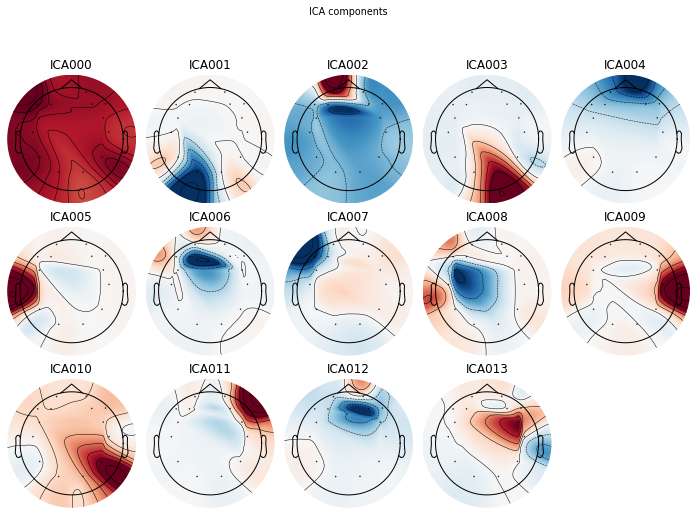

[<MNEFigure size 702x526.68 with 14 Axes>]

In [68]:
ica1 = mne.preprocessing.ICA(method='picard', n_components=14, random_state=0, max_iter=100000)
ica1.fit(filtered_raw1)
ica1.plot_components(outlines='skirt')

ica2 = mne.preprocessing.ICA(method='picard', n_components=14, random_state=0, max_iter=100000)
ica2.fit(filtered_raw2)
ica2.plot_components(outlines='skirt')

Extract bad channels

In [69]:
bad_idx1, scores1 = ica1.find_bads_eog(raw1.copy(), ch_name=['AF3', 'AF4'], threshold=2.7)
print(bad_idx1)

bad_idx2, scores2 = ica2.find_bads_eog(raw2.copy(), ch_name=['AF3', 'AF4'], threshold=2.7)
print(bad_idx2)

Using EOG channels: AF3, AF4
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0

Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 sec)

[]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


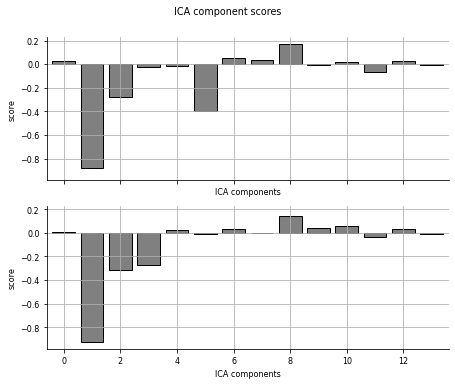

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
254 matching events found
No baseline correction applied
0 projection items activated


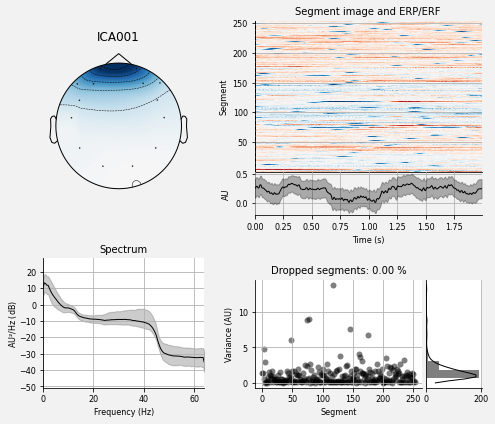

[1]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components


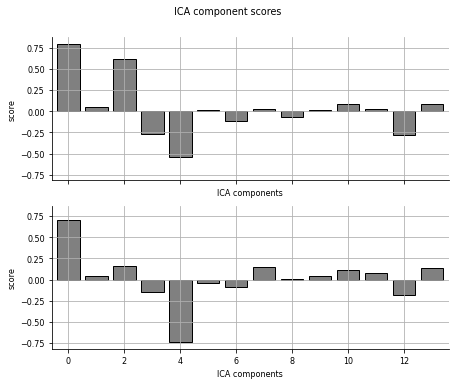

[]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components


<RawEDF | EEG-Game_Patrick_EPOCFLEX-F000015B_EPOCFLEX_123045_2022.08.05T14.35.40.04.00.edf, 16 x 65152 (509.0 s), ~8.0 MB, data loaded>

In [70]:
# barplot of ICA component "ECG match" scores
ica1.plot_scores(scores1)

# plot diagnostics
if len(bad_idx1) > 0:
    ica1.plot_properties(raw1, picks=bad_idx1)

ica1.exclude=bad_idx1
print(ica1.exclude)
reconst_raw1 = raw1.copy()
ica1.apply(reconst_raw1)

# barplot of ICA component "ECG match" scores
ica2.plot_scores(scores2)

# plot diagnostics
if len(bad_idx2) > 0:
    ica2.plot_properties(raw2, picks=bad_idx2)

ica2.exclude=bad_idx2
print(ica2.exclude)
reconst_raw2 = raw2.copy()
ica2.apply(reconst_raw2)


Compare original to ICA filtered eeg data

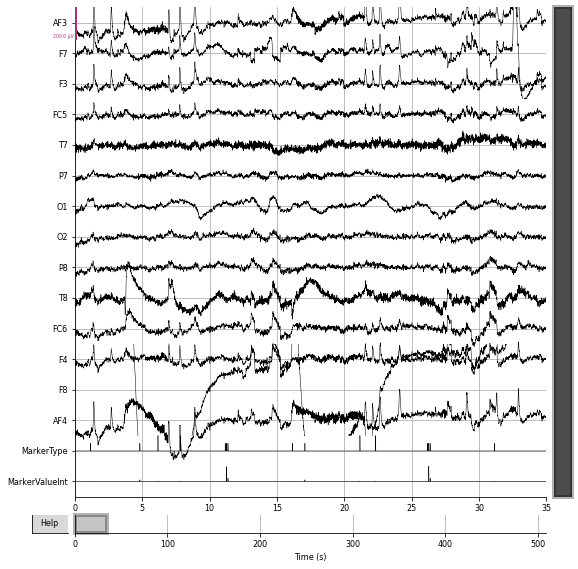

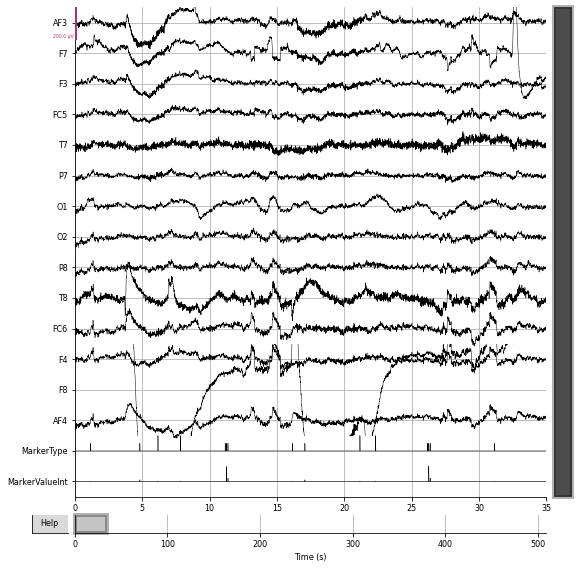

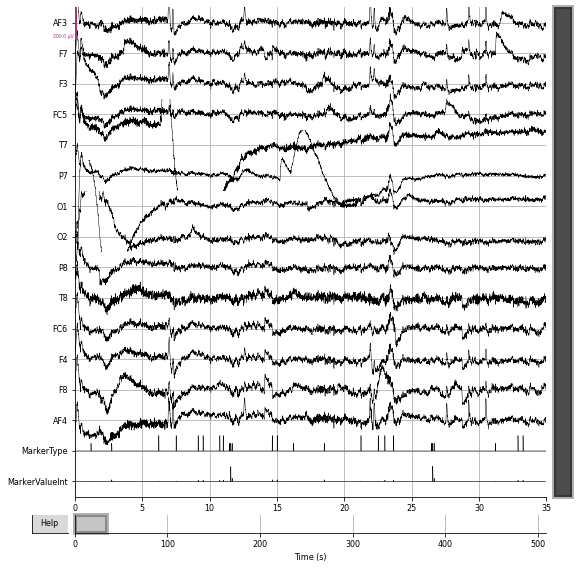

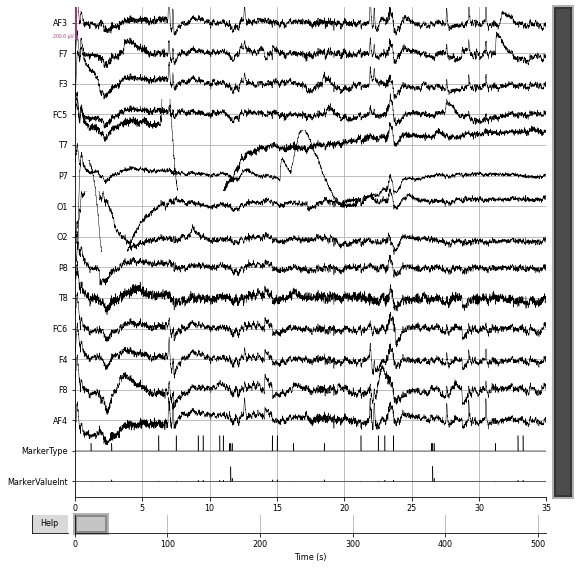

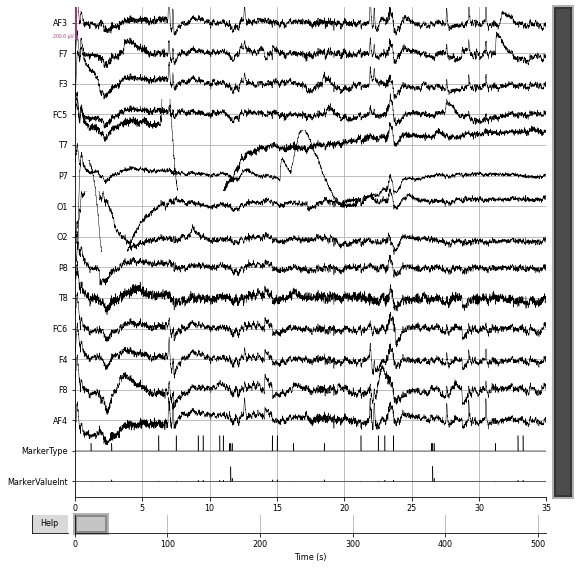

In [71]:
raw1.plot(scalings=0.0001, duration=35)
reconst_raw1.plot(scalings=0.0001, duration=35)

raw2.plot(scalings=0.0001, duration=35)
reconst_raw2.plot(scalings=0.0001, duration=35)

Perform DMD using data from t0 to t1 to get temporal dynamics matrix

(14, 65152)
(14, 65152)


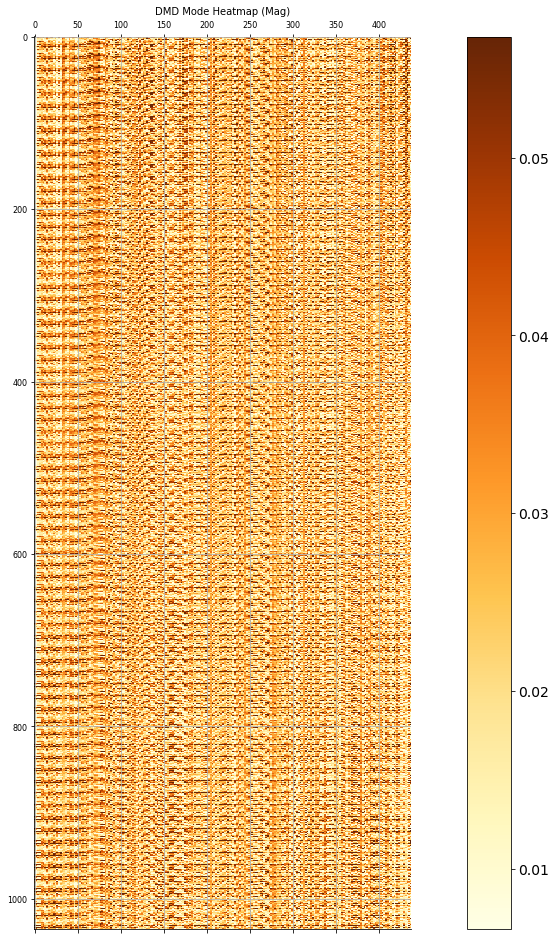

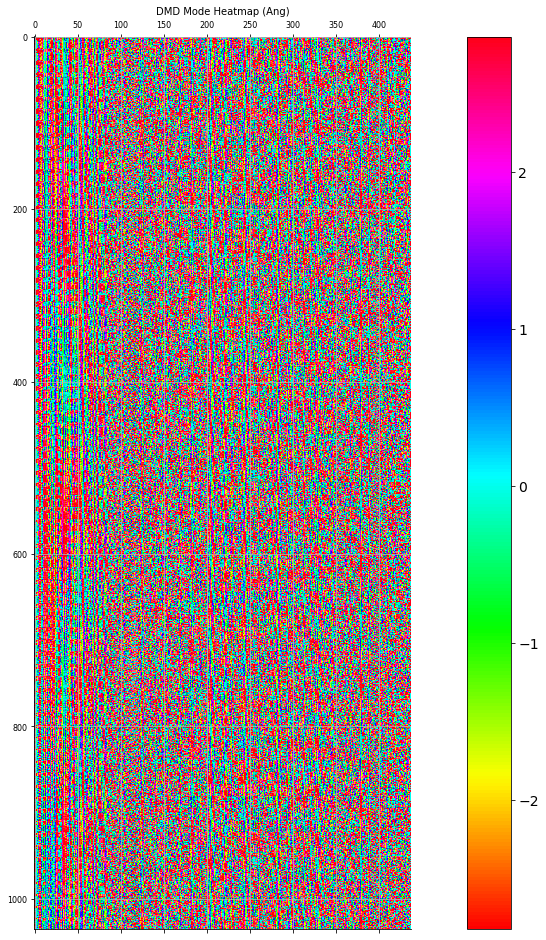

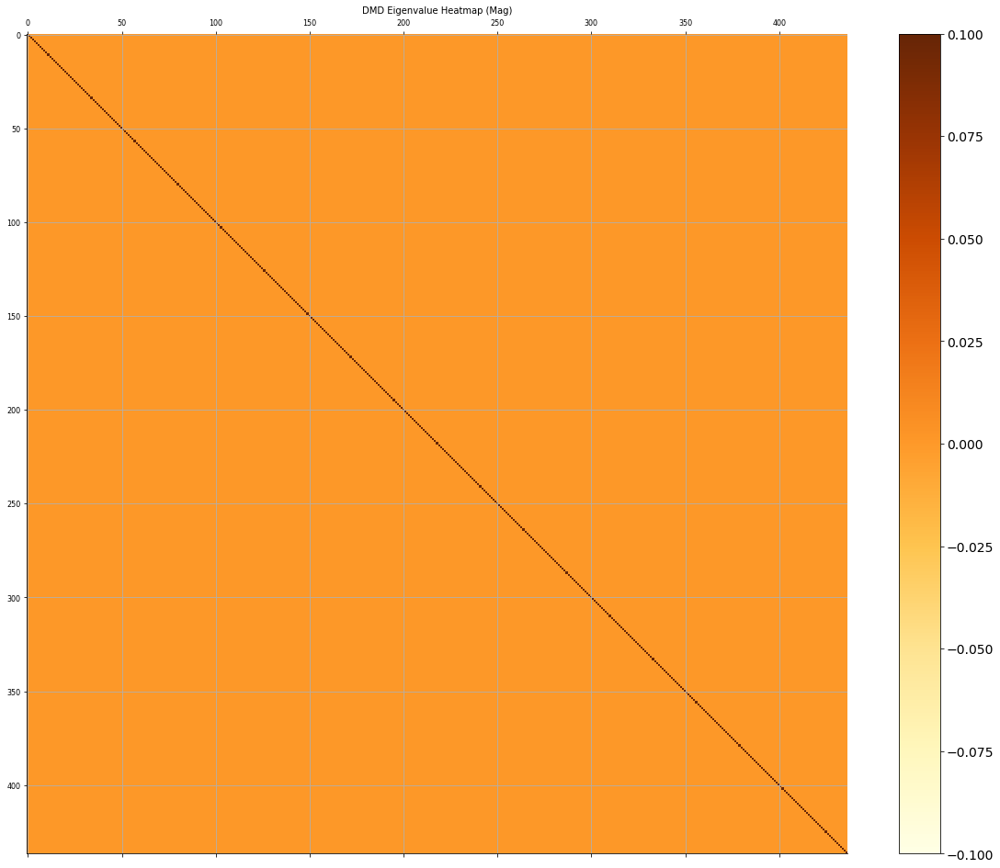

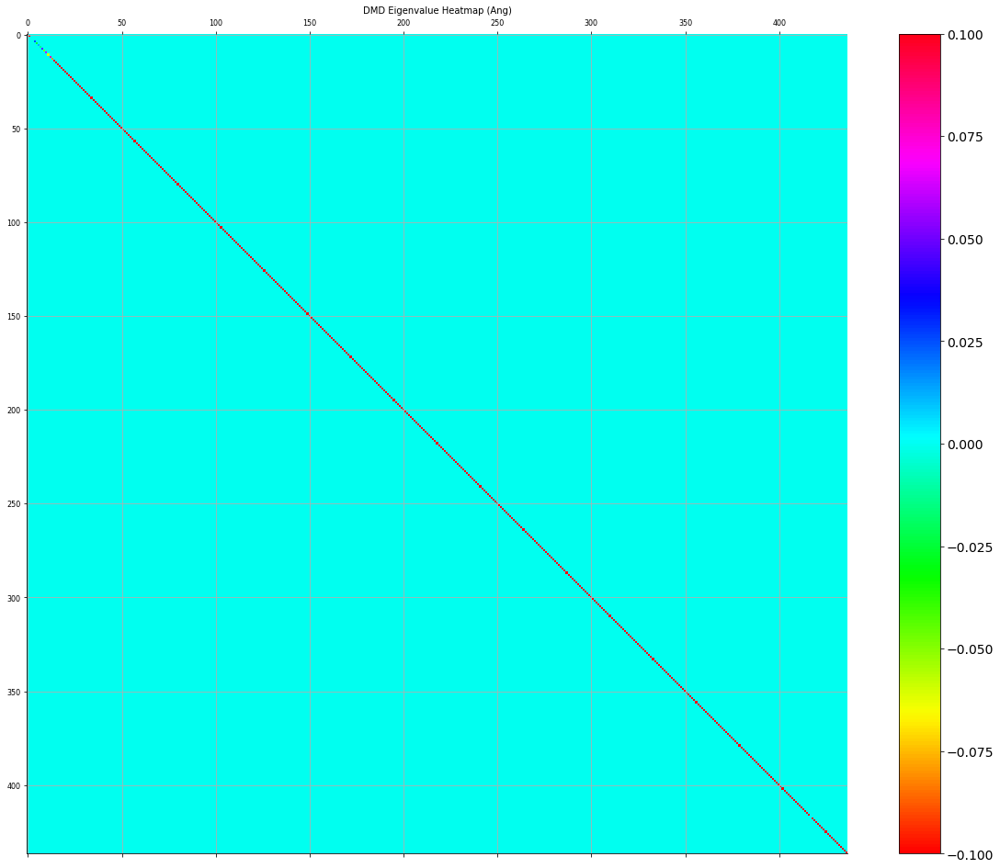

In [72]:
from DataToDynamicsCombined import Datatodynamicscombined
from DataToDynamicsSingle import Datatodynamicssingle
data1 = reconst_raw1.get_data(picks='eeg')
data2 = reconst_raw2.get_data(picks='eeg')
dynamics = Datatodynamicssingle(data1, 0, 512)
dynamics.DMD(plot=True)

print(data1.shape)
print(data2.shape)

array([[-7.91134119e-05-6.53653686e-20j, -7.54647038e-05+8.41374648e-20j,
        -7.04304501e-05-7.89223129e-20j, ...,
        -5.36324920e-03+8.17488438e-17j, -5.41781615e-03+5.30174862e-17j,
        -5.60530508e-03+3.35018471e-17j],
       [-1.62619190e-05-2.19106454e-19j, -4.79605064e-06-1.38719961e-19j,
        -1.32013714e-05-5.03706985e-20j, ...,
         2.85909649e-02-3.70016517e-15j,  2.59539877e-02-3.58046925e-15j,
         2.30246281e-02-3.42087469e-15j],
       [-2.38206793e-05-4.53351569e-20j, -5.06321642e-06-1.53406176e-19j,
        -6.58792616e-06-2.48634714e-20j, ...,
         6.05078434e-03-1.03996672e-15j,  4.98776722e-03-9.64506253e-16j,
         3.86634303e-03-8.78637441e-16j],
       ...,
       [-2.80837712e-06+5.29259341e-20j, -8.69640520e-06-1.32274919e-20j,
        -1.67500121e-05+1.99428148e-19j, ...,
        -5.46198192e-02+8.35442826e-15j, -4.72326624e-02+8.06993361e-15j,
        -3.91492077e-02+7.68135555e-15j],
       [-3.09634636e-05-5.43724280e-20j, -3.

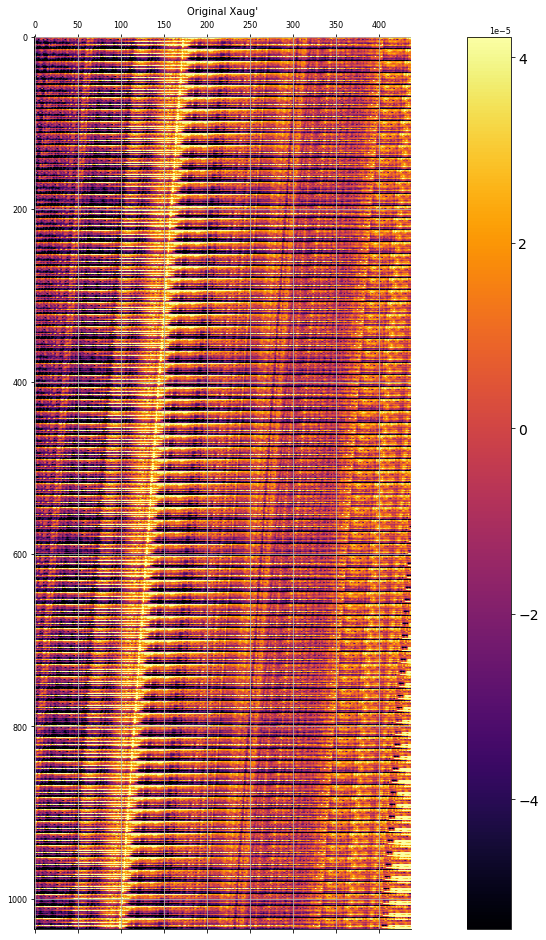

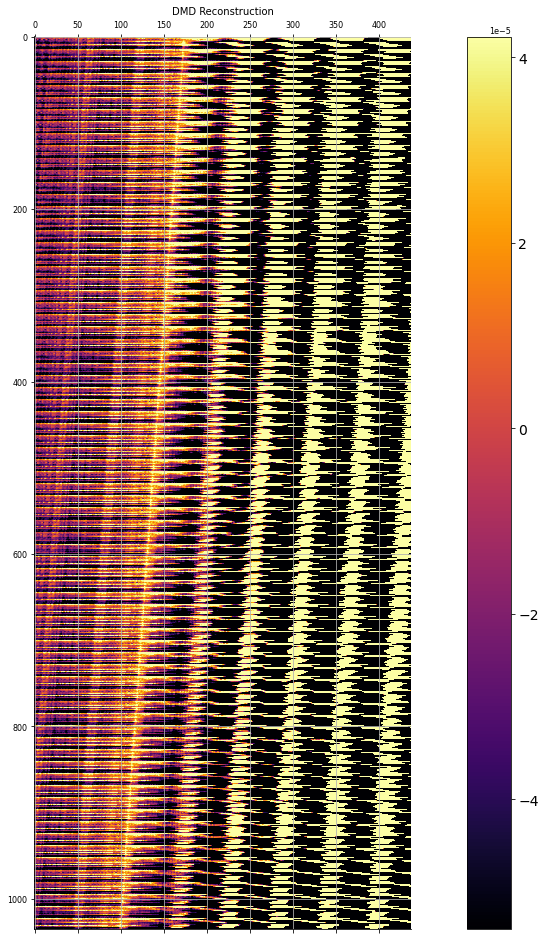

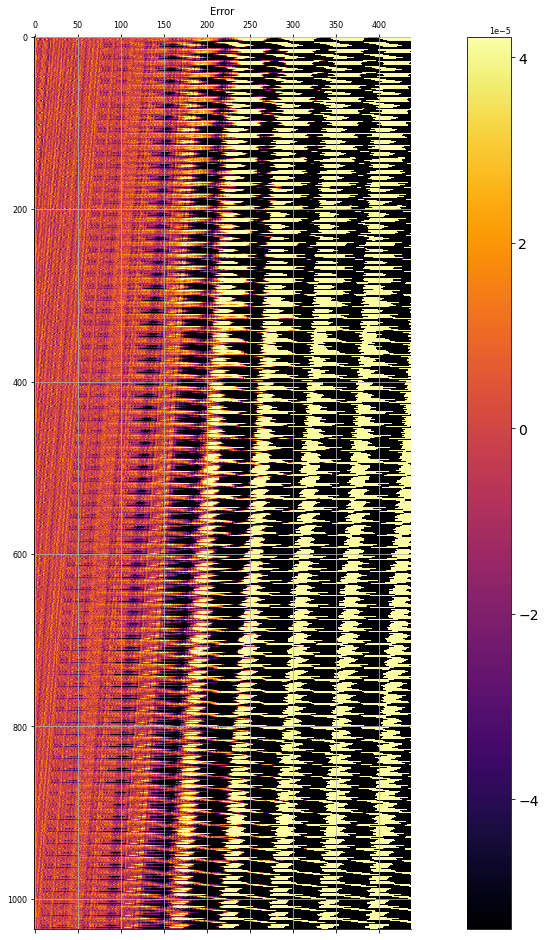

In [73]:
dynamics.reconstruct(plot=True)

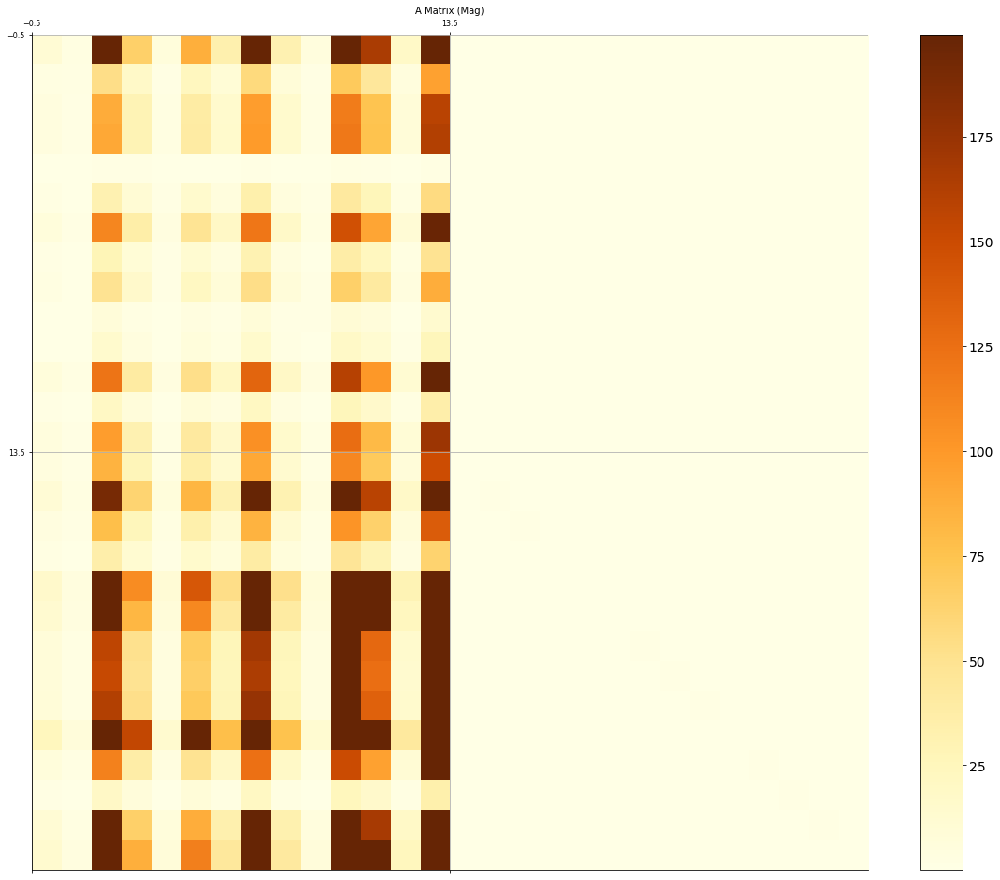

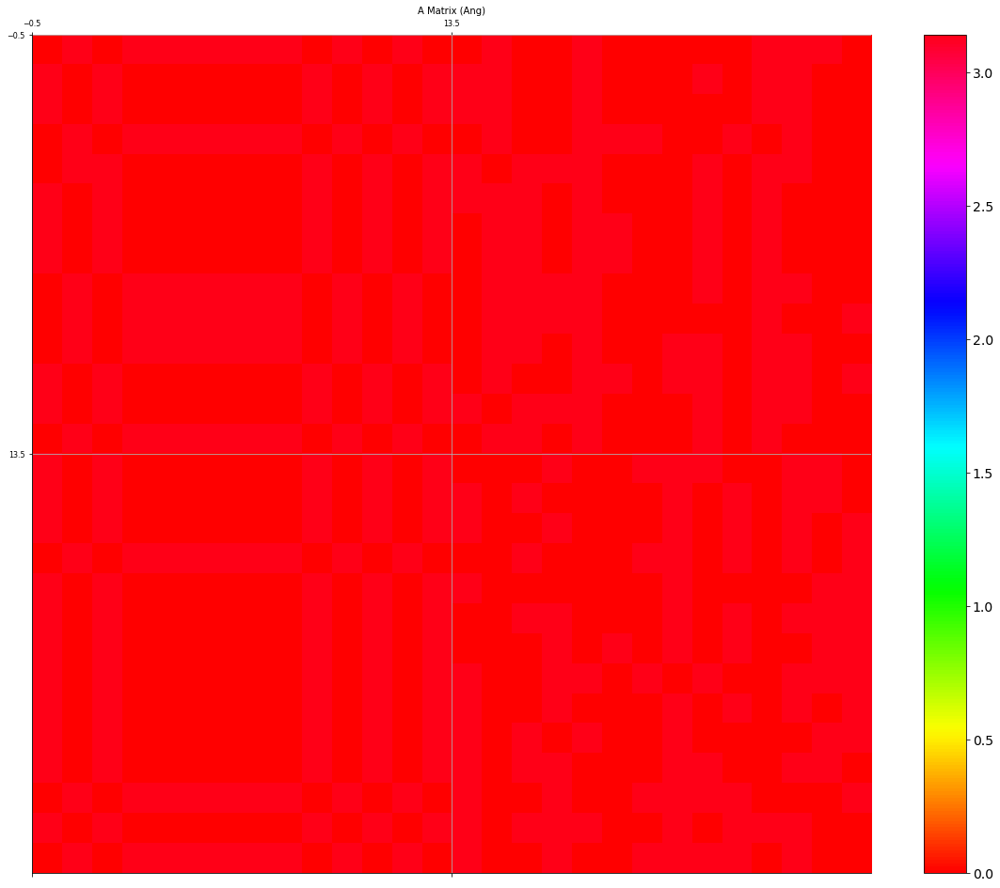

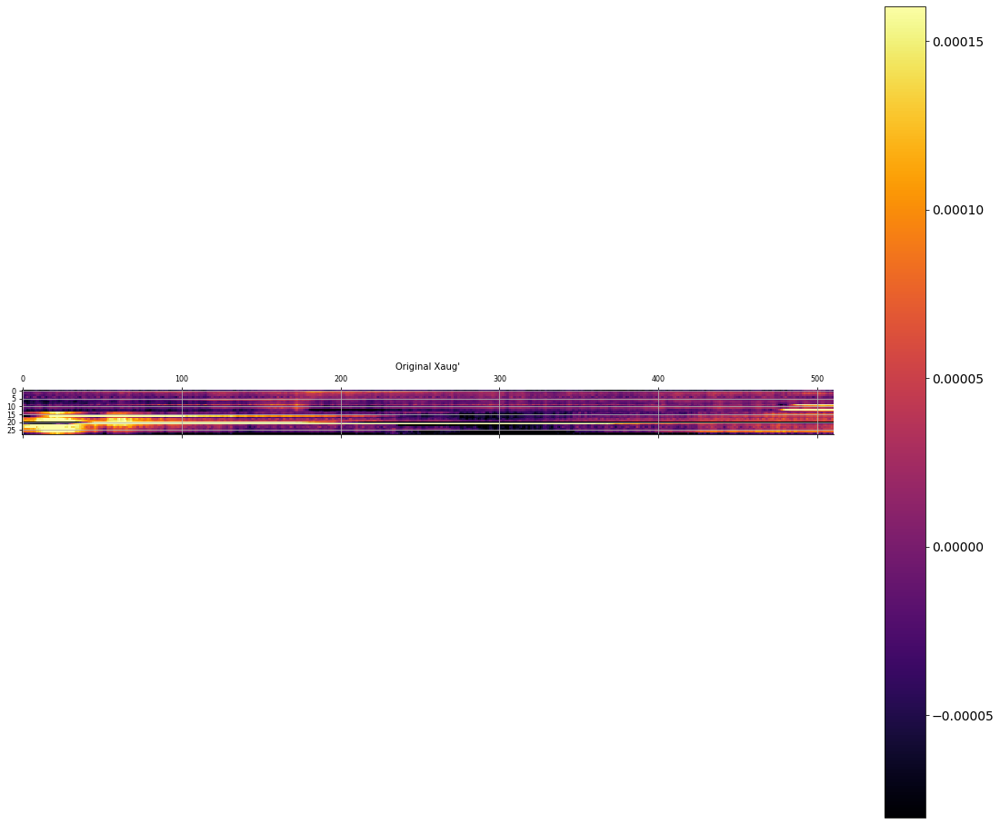

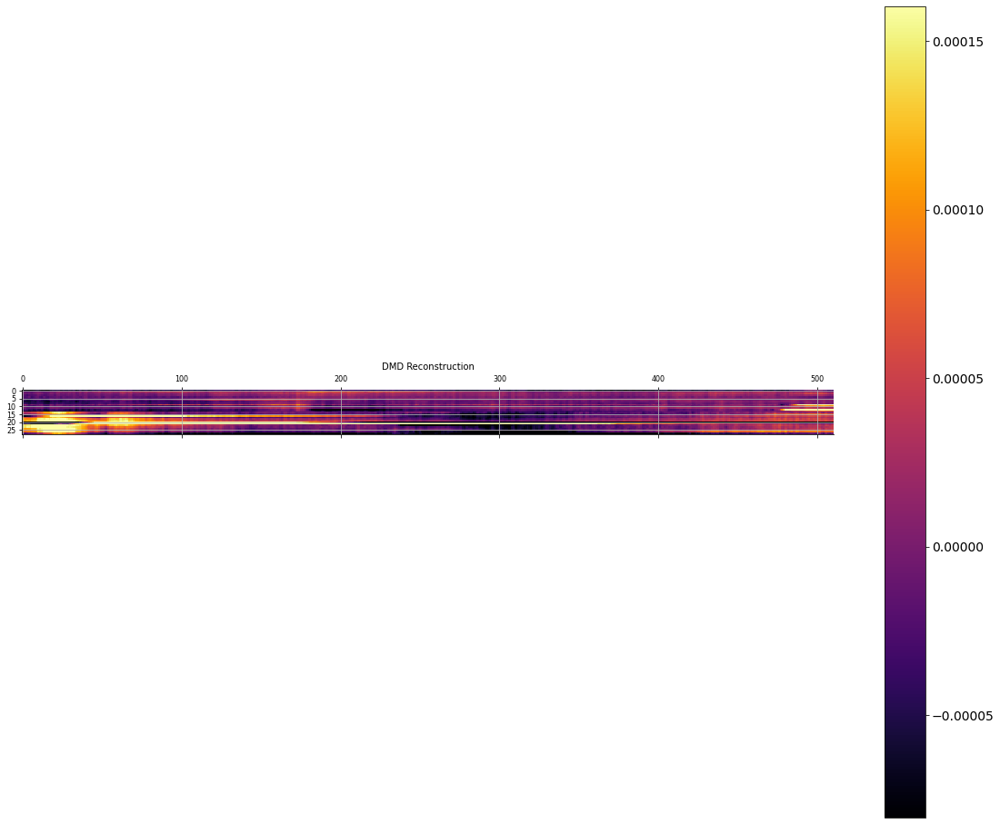

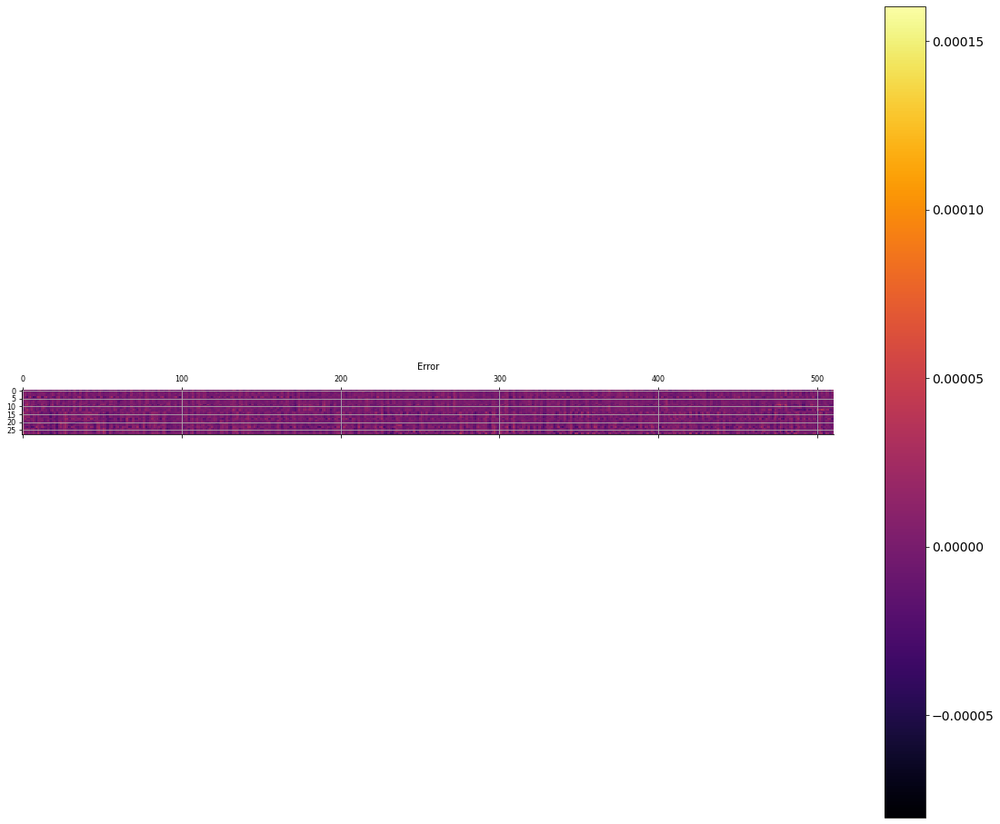

In [74]:
s1 = 512
s0 = s1 - 512
ds = 1
dynamics = Datatodynamicscombined(data1, data2, s0, s1, aug=False)
dynamics.DMDalt(plot=True)
dynamics.reconstructalt(plot=True)
matricies = np.zeros((1, dynamics.A.shape[0], dynamics.A.shape[1]))
matricies[0] = dynamics.A
s1 += ds

while s1 < min(data1.shape[1], data2.shape[1]):
    s0 = s1 - 512
    dynamics = Datatodynamicscombined(data1, data2, s0, s1, aug=False)
    dynamics.DMDalt(plot=False)
    matricies = np.concatenate((matricies, dynamics.A[np.newaxis,:,:]), axis=0)
    s1 += ds


export_name = 'A-Matricies'
# make dir
new_dir = f'{os.getcwd()}\\DynamicsNetExports\\{import_folder}'
if not os.path.exists(new_dir):
    os.makedirs(new_dir)
np.save(f'{new_dir}\\{export_name}', matricies)


In [75]:
from DynamicsToNetwork import Dynamicstonetwork

export_name = 'A-Matricies'
# make dir
new_dir = f'{os.getcwd()}\\DynamicsNetExports\\{import_folder}'
if not os.path.exists(new_dir):
    os.makedirs(new_dir)

stimdata1 = reconst_raw1.pick_types(stim=True).get_data(picks='all')[:,512:]
stimdata2 = reconst_raw2.pick_types(stim=True).get_data(picks='all')[:,512:]

matricies = np.load(f'{new_dir}\\{export_name}.npy')

network = Dynamicstonetwork(matricies, stimdata1, stimdata2)
network.export(import_folder, downsp=4)

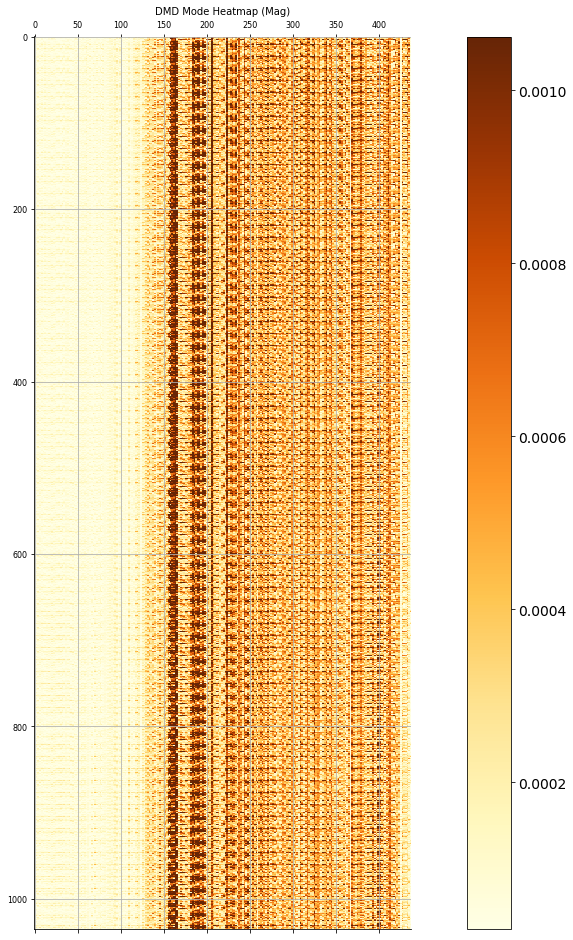

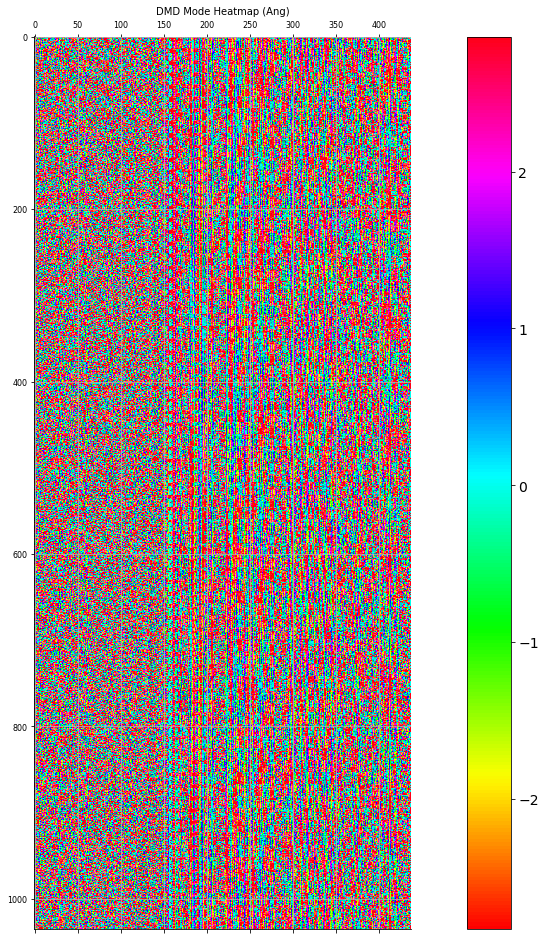

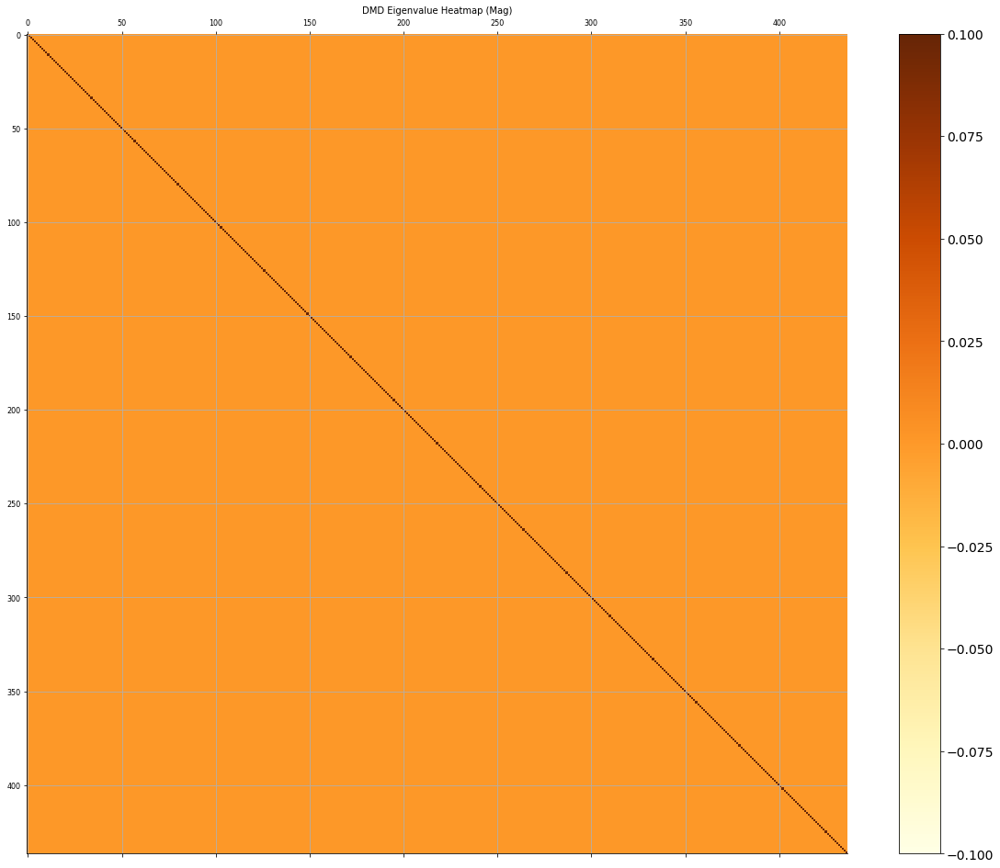

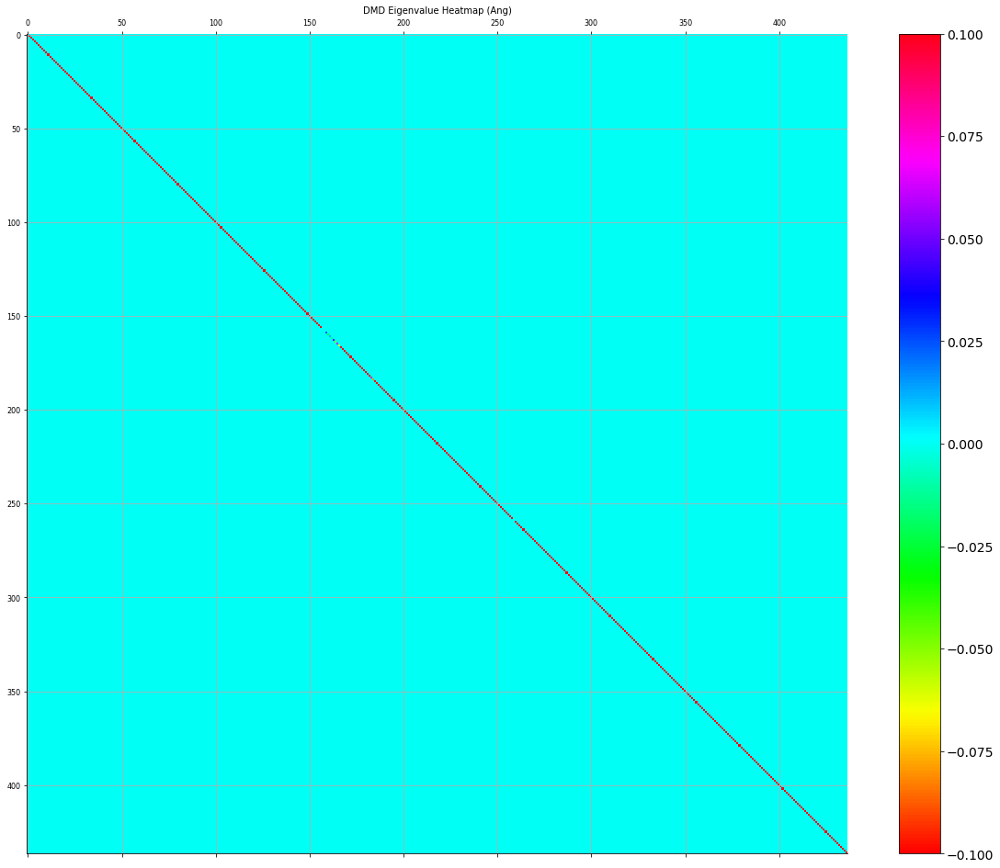

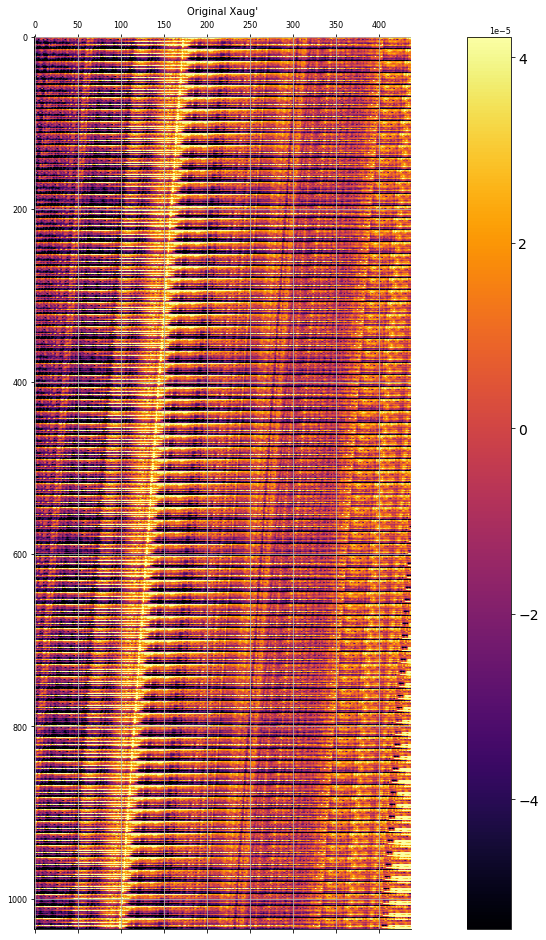

...

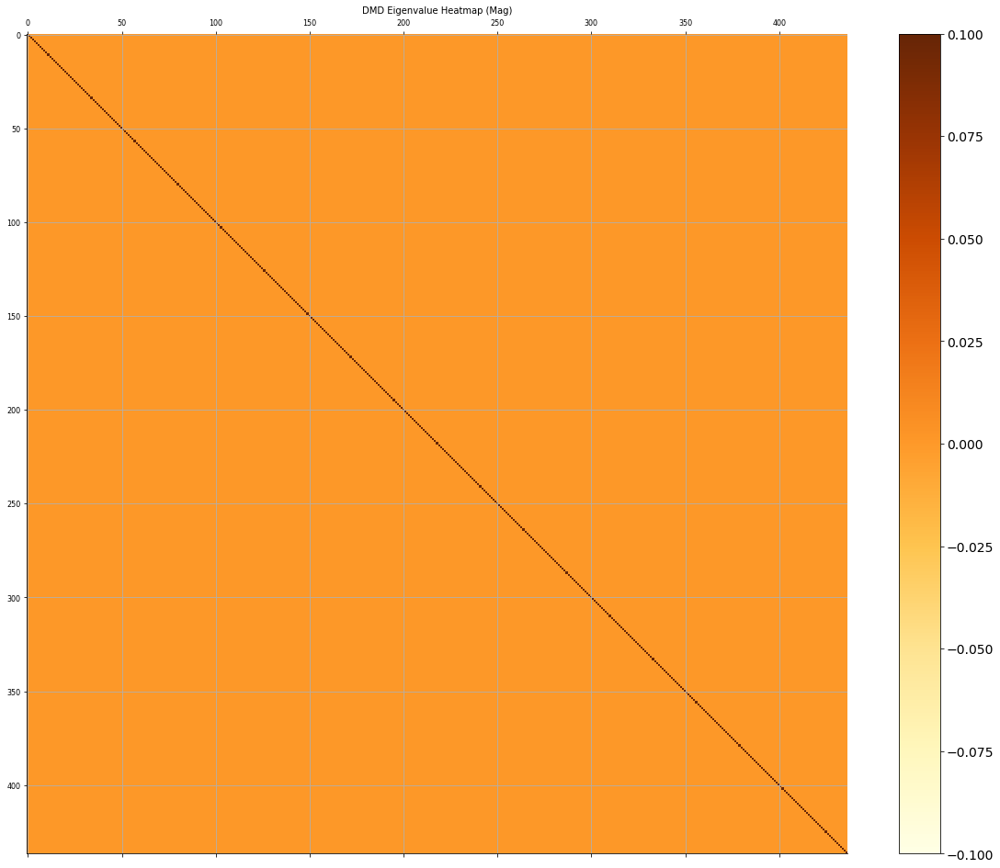

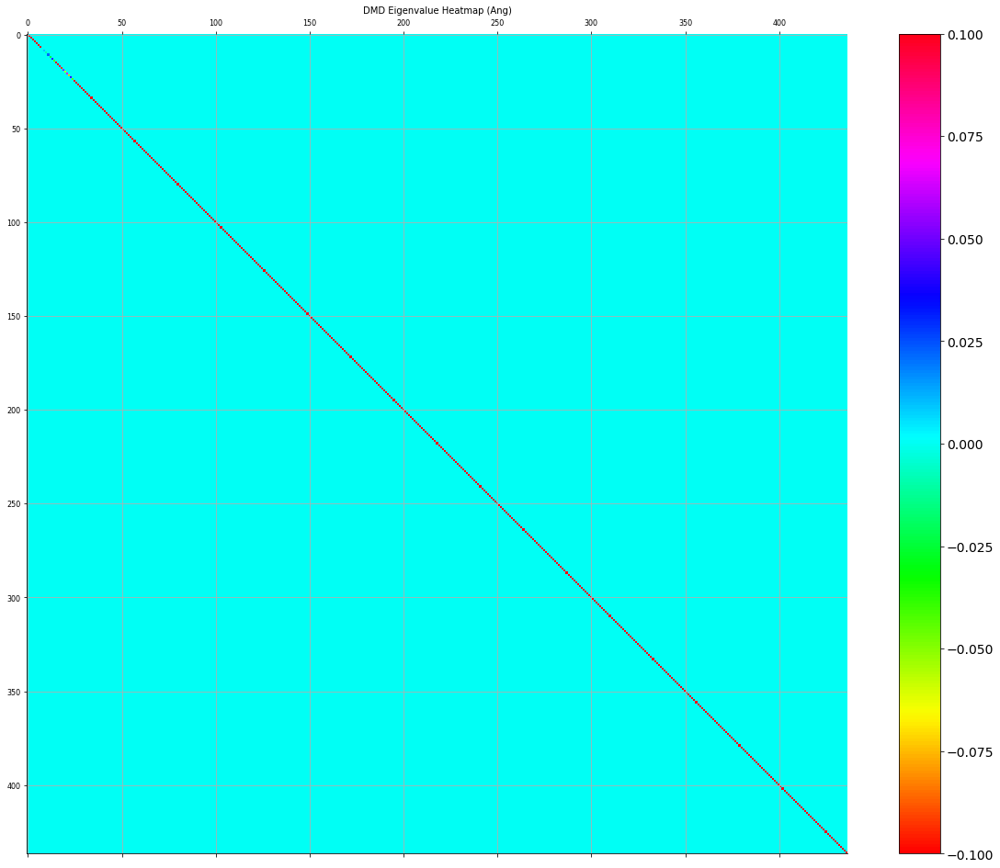

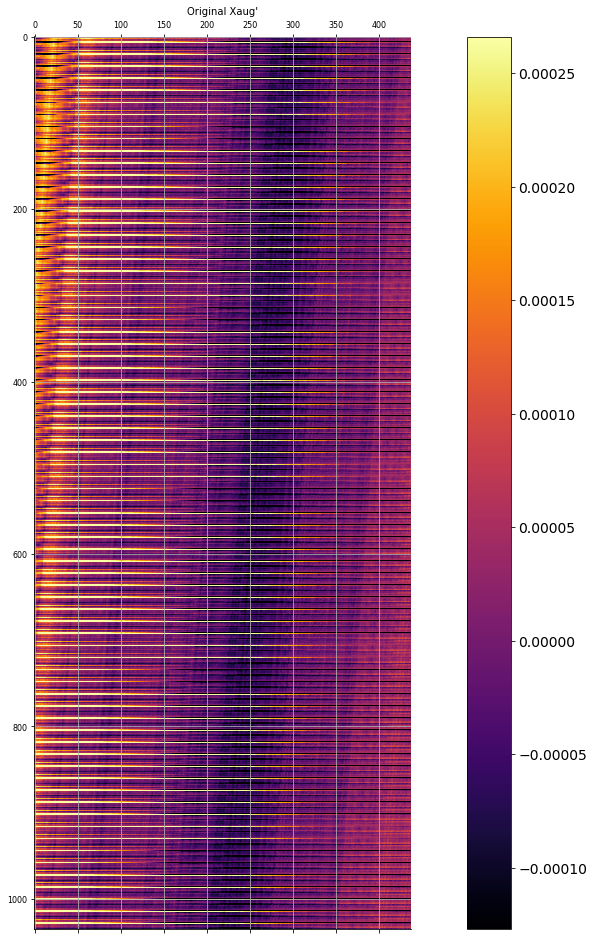

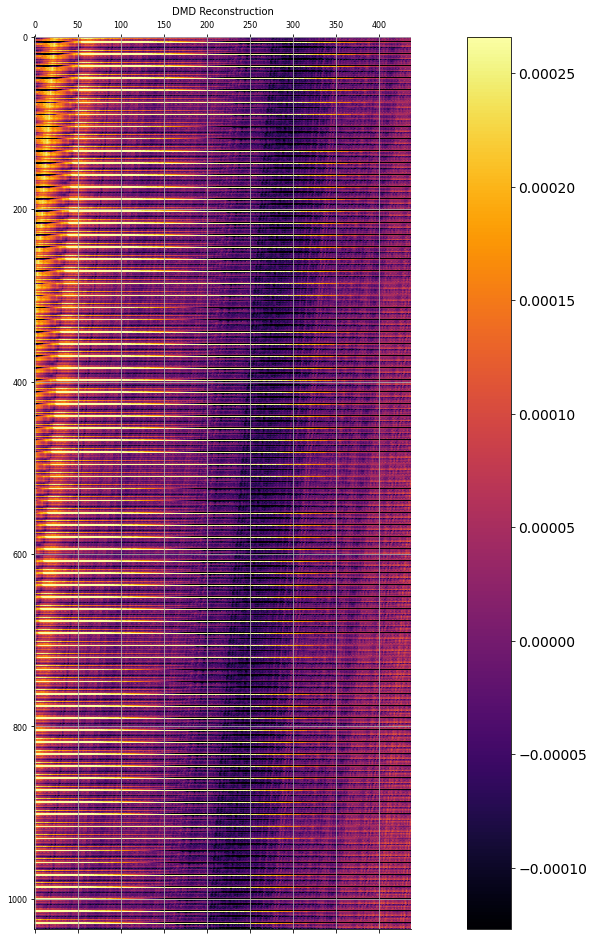

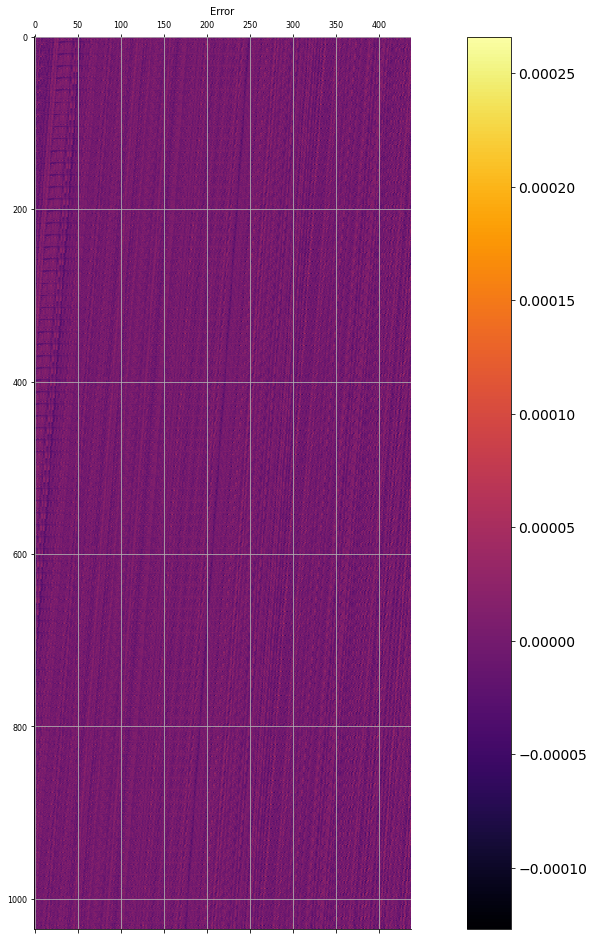

In [76]:
from DataToDynamicsSingle import Datatodynamicssingle
import os
import numpy as np

s1 = 512
s0 = s1 - 512
ds = 128
dynamics = Datatodynamicssingle(data1, s0, s1)
dynamics.DMD(plot=True, energy=True)
dynamics.reconstruct(plot=True)
modesmatricies = np.zeros((1, dynamics.modes.shape[0], dynamics.modes.shape[1]), dtype=complex)
modesmatricies[0] = dynamics.modes
dynamicsmatricies = np.zeros((1, np.diag(dynamics.eigenvalues).shape[0], np.diag(dynamics.eigenvalues).shape[1]), dtype=complex)
dynamicsmatricies[0] = np.diag(dynamics.eigenvalues)
s1 += ds

while s1 < data1.shape[1]:
    s0 = s1 - 512
    dynamics = Datatodynamicssingle(data1, s0, s1)
    dynamics.DMD(plot=False, energy=True)
    modesmatricies = np.concatenate((modesmatricies, dynamics.modes[np.newaxis,:,:]), axis=0)
    dynamicsmatricies = np.concatenate((dynamicsmatricies, np.diag(dynamics.eigenvalues)[np.newaxis,:,:]), axis=0)
    s1 += ds

modes_name = 'Modes-Matricies'
dynamics_name = 'Dynamics-Matricies'
# make dir
new_dir = f'{os.getcwd()}\\DynamicsNetExports\\{import_folder}\\Player 1'
if not os.path.exists(new_dir):
    os.makedirs(new_dir)
np.save(f'{new_dir}\\{modes_name}', modesmatricies)
np.save(f'{new_dir}\\{dynamics_name}', dynamicsmatricies)

# player 2 below
s1 = 512
s0 = s1 - 512
ds = 128
dynamics = Datatodynamicssingle(data2, s0, s1)
dynamics.DMD(plot=True, energy=True)
dynamics.reconstruct(plot=True)
modesmatricies = np.zeros((1, dynamics.modes.shape[0], dynamics.modes.shape[1]), dtype=complex)
modesmatricies[0] = dynamics.modes
dynamicsmatricies = np.zeros((1, np.diag(dynamics.eigenvalues).shape[0], np.diag(dynamics.eigenvalues).shape[1]), dtype=complex)
dynamicsmatricies[0] = np.diag(dynamics.eigenvalues)
s1 += ds

while s1 < data2.shape[1]:
    s0 = s1 - 512
    dynamics = Datatodynamicssingle(data2, s0, s1)
    dynamics.DMD(plot=False, energy=True)
    modesmatricies = np.concatenate((modesmatricies, dynamics.modes[np.newaxis,:,:]), axis=0)
    dynamicsmatricies = np.concatenate((dynamicsmatricies, np.diag(dynamics.eigenvalues)[np.newaxis,:,:]), axis=0)
    s1 += ds

modes_name = 'Modes-Matricies'
dynamics_name = 'Dynamics-Matricies'
# make dir
new_dir = f'{os.getcwd()}\\DynamicsNetExports\\{import_folder}\\Player 2'
if not os.path.exists(new_dir):
    os.makedirs(new_dir)
np.save(f'{new_dir}\\{modes_name}', modesmatricies)
np.save(f'{new_dir}\\{dynamics_name}', dynamicsmatricies)

In [91]:
import numpy as np
import_folder = 'Patrick and Josh Trial 3'

name = 'EEG-Game_Patrick_EPOCFLEX-F000015B_1659725050.2905793_actions.npy'
new_dir = f'{os.getcwd()}\\BCI Modified Chicken\\EEGExports\\{import_folder}\\{name}'
times = np.load(new_dir)
start = times[0, 0]
centers = []
rights = []
lefts = []
for i in range(times.shape[0]):
    print(round(times[i, 0] - start, 1), times[i, 1], times[i, 2])
    if i != times.shape[0] - 1:
        if times[i, 2] == 0:
            lefts.append(round(times[i - 1, 0] - start, 1))
        elif times[i, 2] == 1:
            centers.append(round(times[i - 1, 0] - start, 1))
        elif times[i, 2] == 2:
            rights.append(round(times[i - 1, 0] - start, 1))

print(centers)
print(rights)
print(lefts)

0.0 -1.0 -1.0
1.2 2.0 -1.0
6.2 3.0 2.0
11.4 1.0 -1.0
16.2 2.0 -1.0
21.2 3.0 2.0
26.4 1.0 -1.0
31.2 2.0 -1.0
36.2 3.0 1.0
41.4 1.0 -1.0
46.2 2.0 -1.0
51.2 3.0 1.0
56.5 1.0 -1.0
61.2 2.0 -1.0
66.2 3.0 2.0
71.5 1.0 -1.0
76.2 2.0 -1.0
81.2 3.0 1.0
86.5 1.0 -1.0
91.3 2.0 -1.0
96.3 3.0 0.0
101.5 1.0 -1.0
106.3 2.0 -1.0
111.3 3.0 1.0
116.5 1.0 -1.0
121.3 2.0 -1.0
126.3 3.0 1.0
131.5 1.0 -1.0
136.3 2.0 -1.0
141.3 3.0 2.0
146.6 1.0 -1.0
151.3 2.0 -1.0
156.3 3.0 2.0
161.6 1.0 -1.0
166.3 2.0 -1.0
171.3 3.0 1.0
176.6 1.0 -1.0
181.3 2.0 -1.0
186.3 3.0 0.0
191.6 1.0 -1.0
196.4 2.0 -1.0
201.4 3.0 2.0
206.6 1.0 -1.0
211.4 2.0 -1.0
216.4 3.0 2.0
221.6 1.0 -1.0
226.4 2.0 -1.0
231.4 3.0 1.0
236.6 1.0 -1.0
241.4 2.0 -1.0
246.4 3.0 1.0
251.6 1.0 -1.0
256.4 2.0 -1.0
261.4 3.0 1.0
266.6 1.0 -1.0
271.4 2.0 -1.0
276.4 3.0 1.0
281.7 1.0 -1.0
286.4 2.0 -1.0
291.4 3.0 0.0
296.7 1.0 -1.0
301.4 2.0 -1.0
306.5 3.0 1.0
311.7 1.0 -1.0
316.5 2.0 -1.0
321.5 3.0 0.0
326.7 1.0 -1.0
331.5 2.0 -1.0
336.5 3.0 2.0
341.7 1.0 -

(505, 1036, 437)


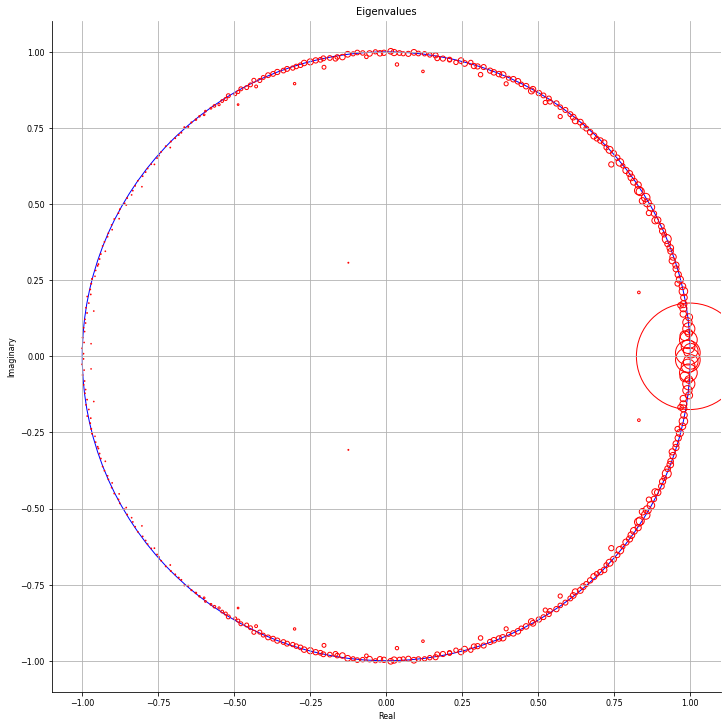

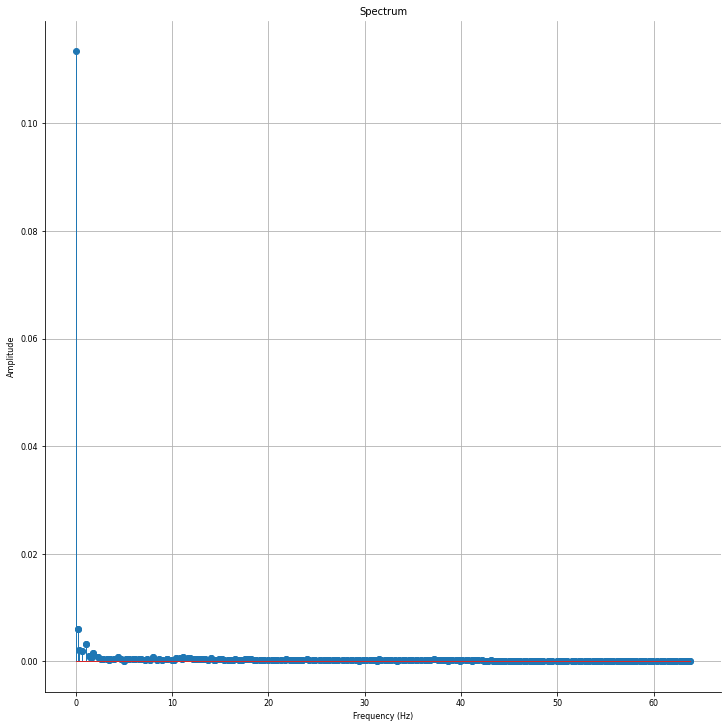

D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:153: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels([''] + alphabets)
D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:155: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([''] + rowlist)
D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:166: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels([''] + alphabets)
D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:168: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels([''] + rowlist)


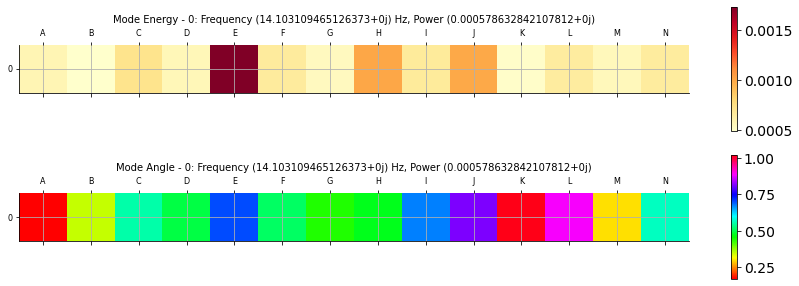

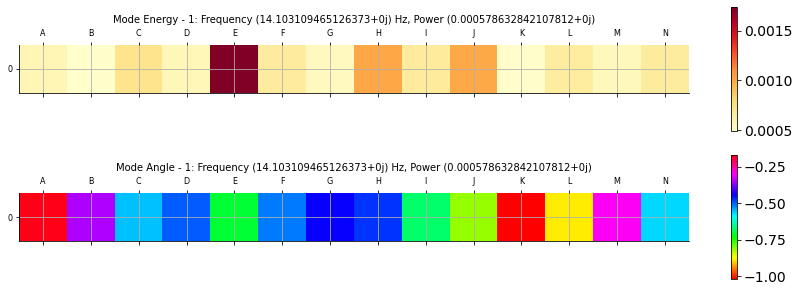

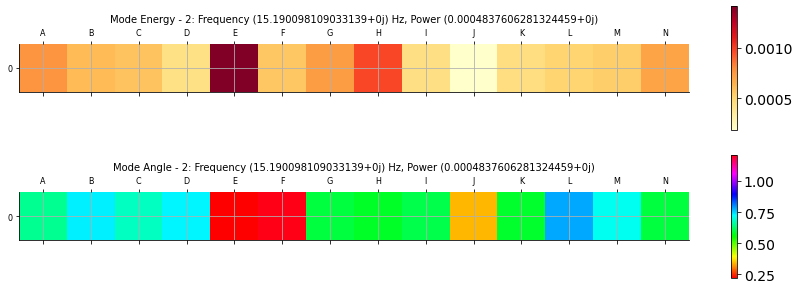

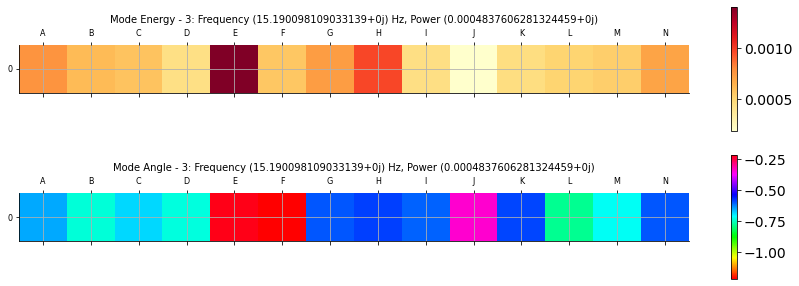

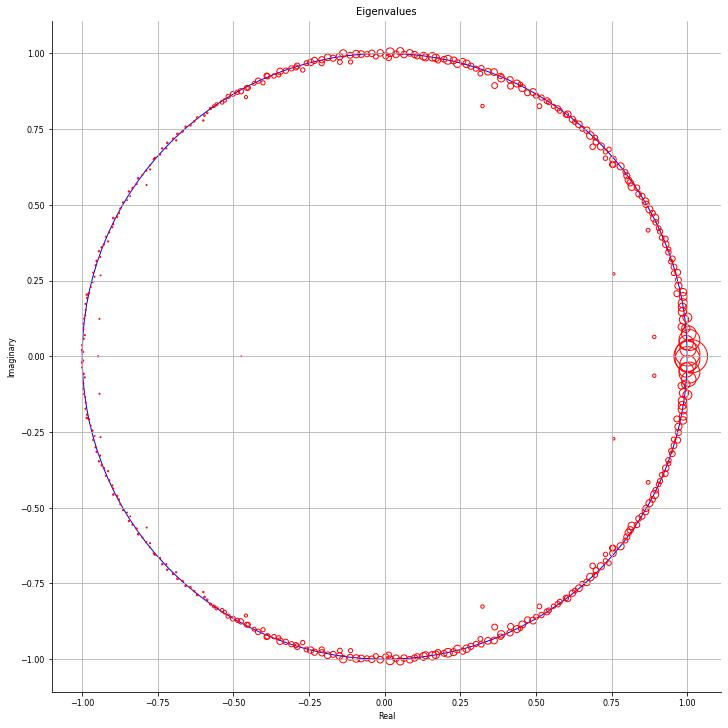

...

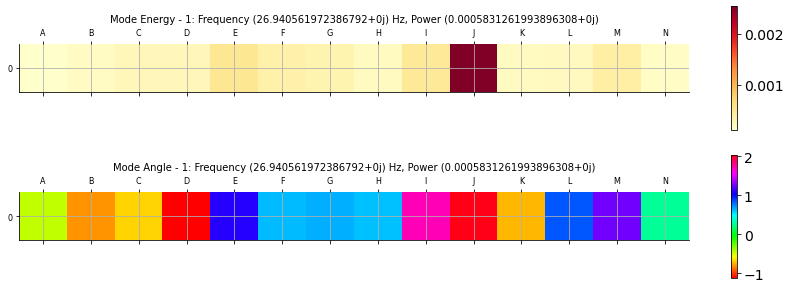

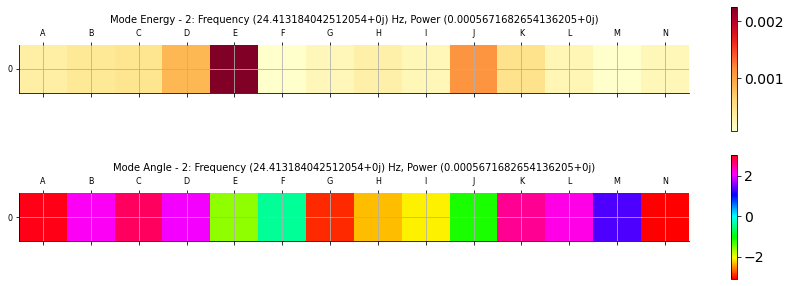

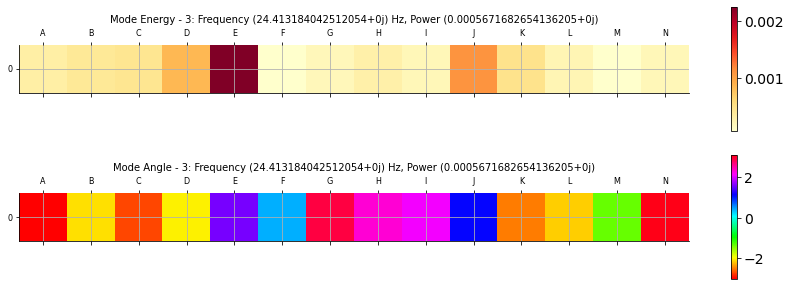

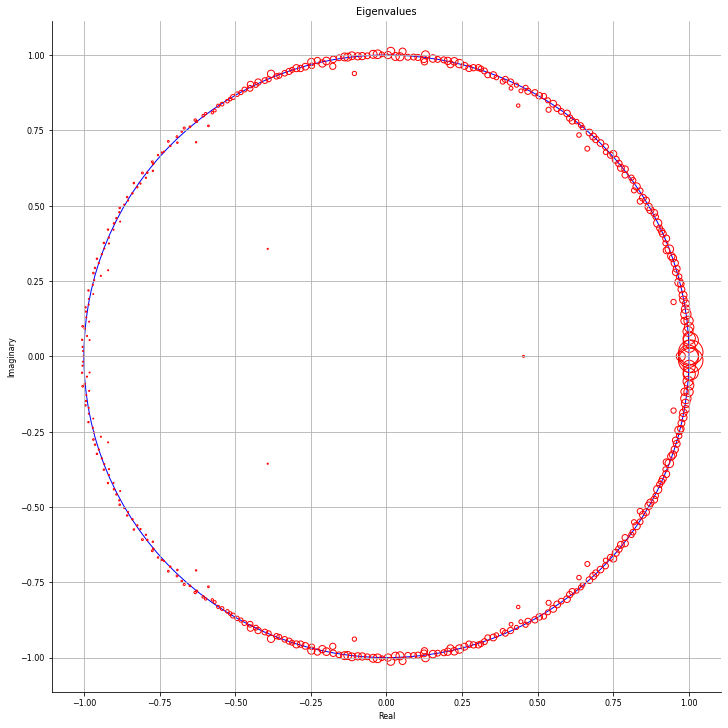

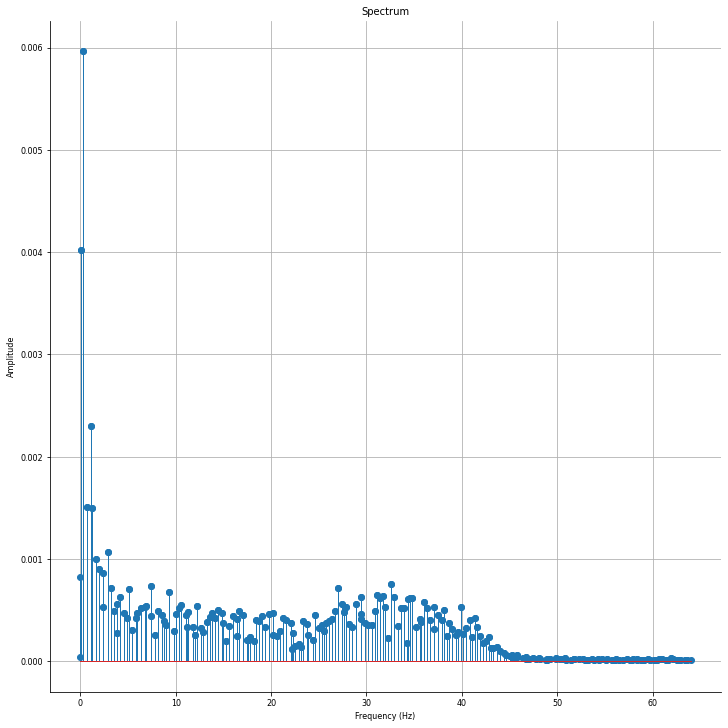

D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:239: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels([''] + alphabets)
D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:241: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([''] + ['1'])
D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:254: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels([''] + alphabets)
D:\Pycharm Projects\EEG-Game-V2\DynamicsToData.py:256: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels([''] + rowlist)


[<module 'matplotlib.pyplot' from 'C:\\Users\\Joshu\\PycharmProjects\\venv\\lib\\site-packages\\matplotlib\\pyplot.py'>]

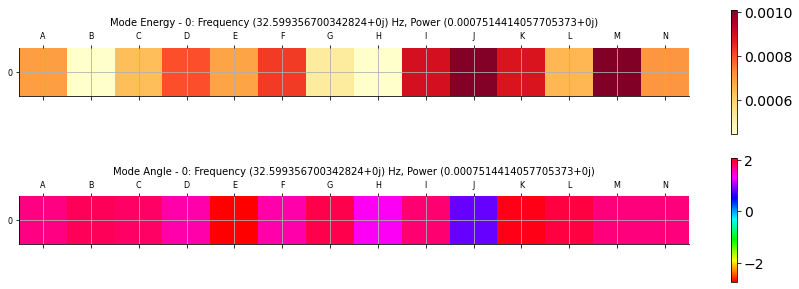

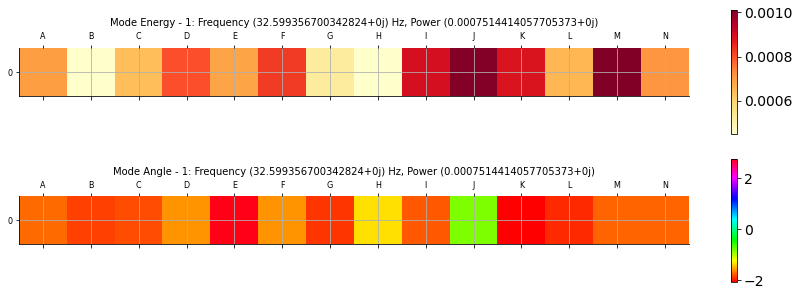

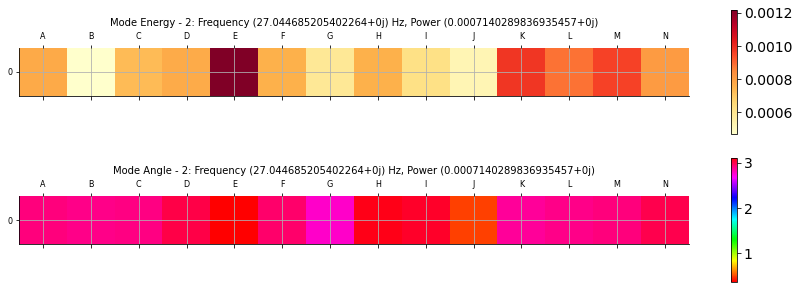

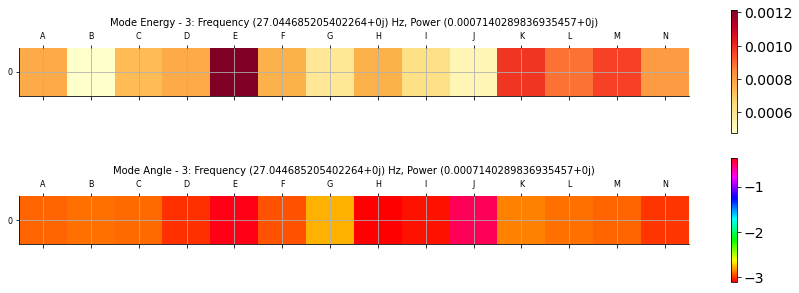

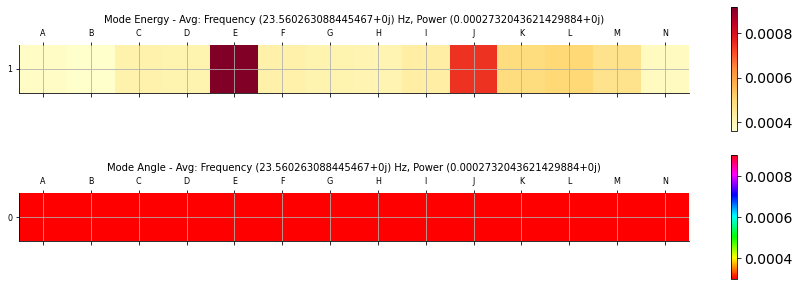

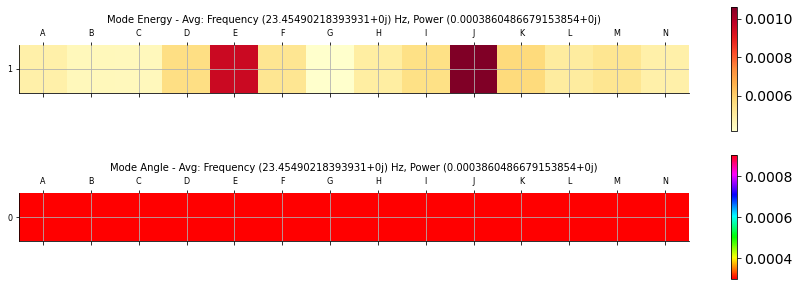

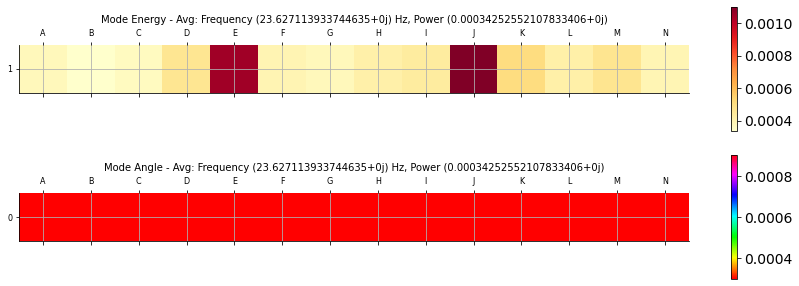

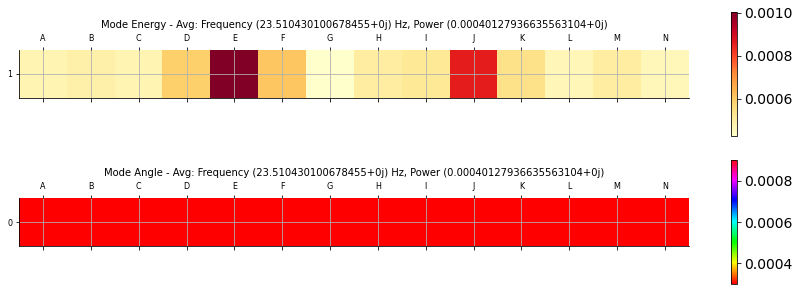

In [78]:
from DynamicsToData import Dynamicstodata
import os
import numpy as np

player_number = 1
import_folder = 'Patrick and Josh Trial 3'
modes_name = 'Modes-Matricies'
dynamics_name = 'Dynamics-Matricies'
# make dir
new_dir = f'{os.getcwd()}\\DynamicsNetExports\\{import_folder}\\Player {str(player_number)}'

modes = np.load(f'{new_dir}\\{modes_name}.npy')
dynamics = np.load(f'{new_dir}\\{dynamics_name}.npy')
print(modes.shape)

data = Dynamicstodata(modes[11-4], dynamics[11-4])  # Goes middle
data.plot_eigs()
data.plot_spectrum()
data.plot_modes(12, 35, arr='power', rows=1, number=4)

data1 = Dynamicstodata(modes[57-4], dynamics[57-4])  # Goes middle
data1.plot_eigs()
data1.plot_spectrum()
data1.plot_modes(12, 35, arr='power', rows=1, number=4)

data2 = Dynamicstodata(modes[27-4], dynamics[27-4])  # Goes side
data2.plot_eigs()
data2.plot_spectrum()
data2.plot_modes(12, 35, arr='power', rows=1, number=4)

data3 = Dynamicstodata(modes[72-4], dynamics[72-4])  # Goes side
data3.plot_eigs()
data3.plot_spectrum()
data3.plot_modes(12, 35, arr='power', rows=1, number=4)

data.plot_mode_avg(12, 35, rows=1, clima=(0.0003, 0.0009))
data1.plot_mode_avg(12, 35, rows=1, clima=(0.0003, 0.0009))
data2.plot_mode_avg(12, 35, rows=1, clima=(0.0003, 0.0009))
data3.plot_mode_avg(12, 35, rows=1, clima=(0.0003, 0.0009))

T-Test A: 0.3652587680255134
T-Test B: 0.35535263492336044
T-Test C: 0.09473507293325628
T-Test D: 0.14256033701433218
T-Test E: 0.839708671329854
T-Test F: 0.10154243079597394
T-Test G: 0.5837922271283559
T-Test H: 0.6645117624400488
T-Test I: 0.20421972310785141
T-Test J: 0.08448104447240254
T-Test K: 0.40151543895090946
T-Test L: 0.14824390008193347
T-Test M: 0.6615973667969036
T-Test N: 0.4769334524818615


C:\Users\Joshu\AppData\Local\Temp\ipykernel_10092\2885326948.py:93: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb1 = figure.colorbar(caxes)
C:\Users\Joshu\AppData\Local\Temp\ipykernel_10092\2885326948.py:96: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels([''] + alphabets)
C:\Users\Joshu\AppData\Local\Temp\ipykernel_10092\2885326948.py:98: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([''] + ['1'])
C:\Users\Joshu\AppData\Local\Temp\ipykernel_10092\2885326948.py:106: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb1 = figure.colorbar(caxes)
C:\Users\Joshu\AppData\Local\Temp\ipykernel_10092\2885326948.py:109: UserWa

[Text(0, -1.0, ''), Text(0, 0.0, '1'), Text(0, 1.0, '')]

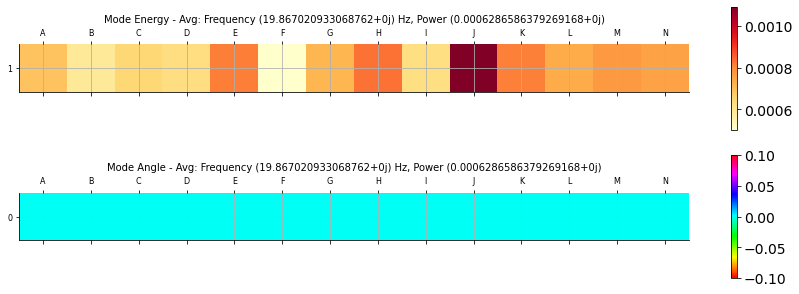

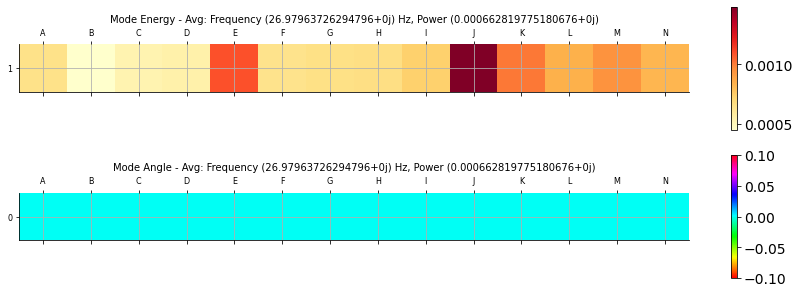

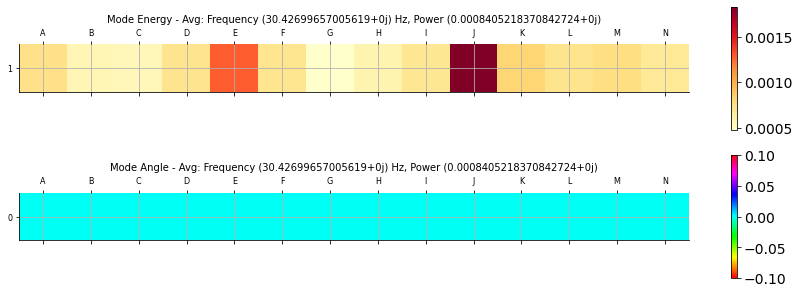

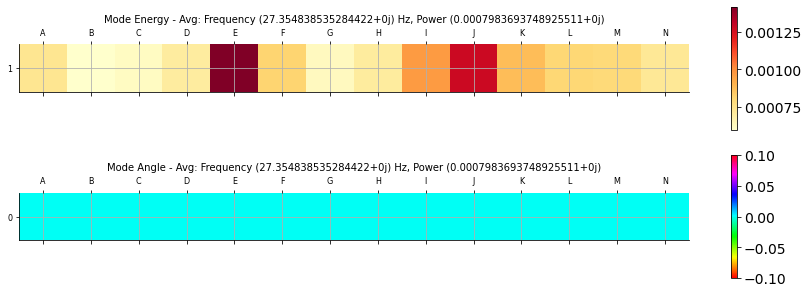

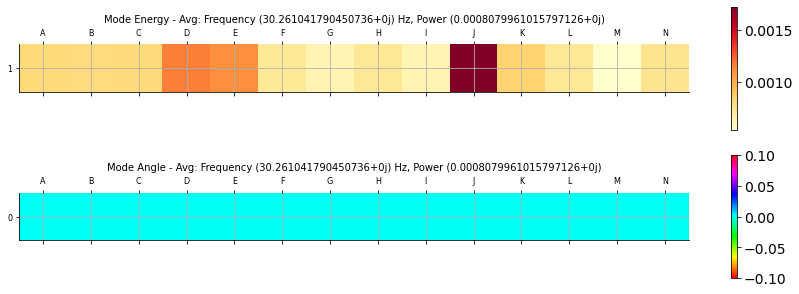

...

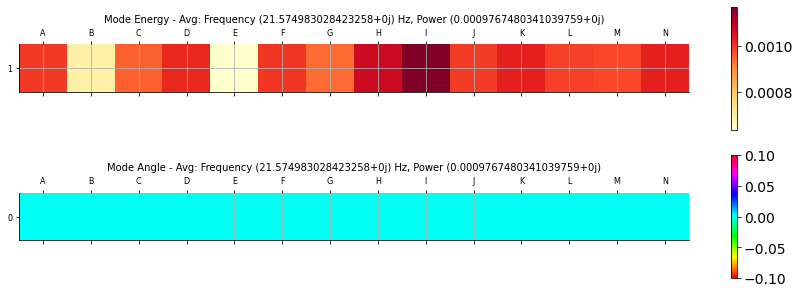

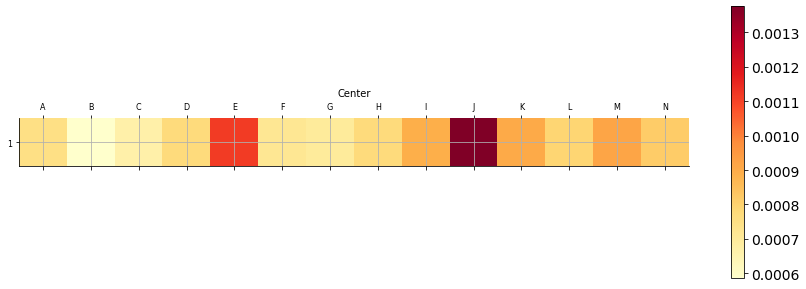

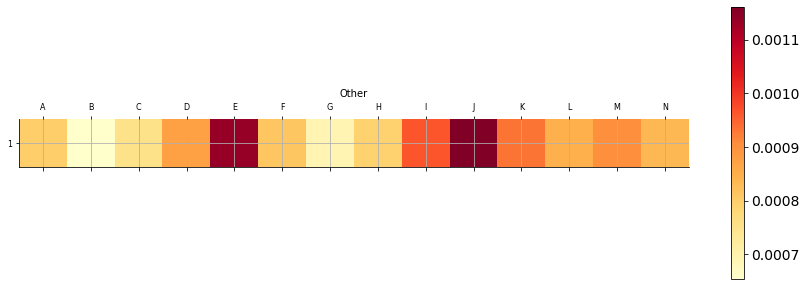

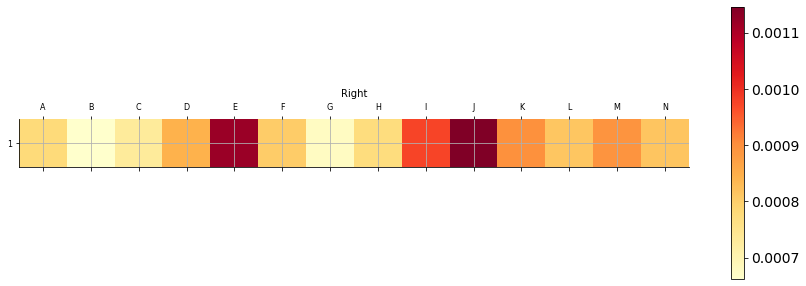

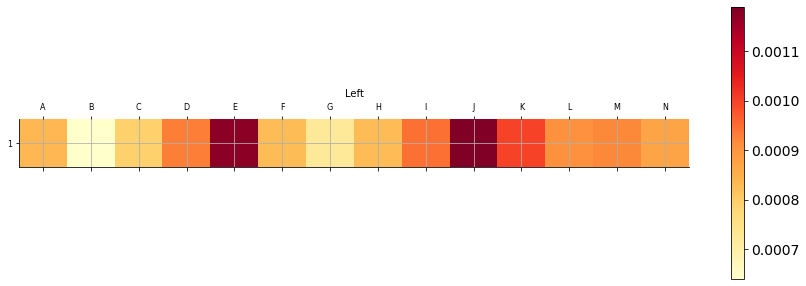

In [97]:
from DynamicsToData import Dynamicstodata
import os
import numpy as np
from matplotlib.ticker import MultipleLocator
from scipy import stats as stats

freq_lower = 12
freq_upper = 35

use_top = 10

# Josh
# [1.9, 47.0, 77.0, 107.0, 122.0, 152.0, 167.1, 197.1, 227.1, 257.2, 272.2, 287.2, 302.2]
# [16.9, 62.0, 137.0, 182.1, 242.2]
# [31.9, 92.0, 212.1, 317.2]

# Patrick
# [2.0, 17.0, 77.1, 122.1, 167.2, 182.2, 227.2, 257.3, 272.3, 287.3, 302.3, 317.3]
# [47.1, 62.1, 137.1, 152.1, 242.3]
# [32.0, 92.1, 107.1, 197.2, 212.2]

# Josh
# [31.1, 46.1, 61.1, 106.2, 121.2, 151.2, 226.3, 241.3, 256.3, 271.3, 286.3, 331.4, 361.4, 391.4, 421.5, 436.5, 451.5, 481.5, 496.5]
# [1.1, 16.1, 76.1, 91.2, 166.2, 181.2, 196.3, 211.3, 316.4, 346.4]
# [136.2, 301.3, 376.4, 406.5, 466.5]

center_times = [31-4, 46-4, 61-4, 106-4, 121-4, 151-4, 226-4, 241-4, 256-4, 271-4, 286-4, 331-4, 361-4, 391-4, 421-4, 436-4, 451-4, 481-4]
right_times = [16-4, 76-4, 91-4, 116-4, 181-4, 196-4, 211-4, 316-4, 346-4]
left_times = [136-4, 301-4, 376-4, 406-4, 466-4]
other_times = [16-4, 76-4, 91-4, 116-4, 181-4, 196-4, 211-4, 316-4, 346-4, 136-4, 301-4, 376-4, 406-4, 466-4]

modes_name = 'Modes-Matricies'
dynamics_name = 'Dynamics-Matricies'
player_number = 1
# make dir
new_dir = f'{os.getcwd()}\\DynamicsNetExports\\{import_folder}\\Player {str(player_number)}'

modes = np.load(f'{new_dir}\\{modes_name}.npy')
dynamics = np.load(f'{new_dir}\\{dynamics_name}.npy')

all_center_avg_modes = np.zeros((14, len(center_times)))

for i, x in enumerate(center_times):
    data = Dynamicstodata(modes[x], dynamics[x])  # Goes middle
    data.plot_mode_avg(freq_lower, freq_upper, rows=1, arr='power', number=use_top)
    avgfreq, avgpower, avgmodesabs, avgmodesangles = data.find_mode_avg(freq_lower, freq_upper, arr='power', number=use_top)
    all_center_avg_modes[:, i] = avgmodesabs[0:14]

all_right_avg_modes = np.zeros((14, len(right_times)))

for i, x in enumerate(right_times):
    data = Dynamicstodata(modes[x], dynamics[x])  # Goes middle
    data.plot_mode_avg(freq_lower, freq_upper, rows=1, arr='power', number=use_top)
    avgfreq, avgpower, avgmodesabs, avgmodesangles = data.find_mode_avg(freq_lower, freq_upper, arr='power', number=use_top)
    all_right_avg_modes[:, i] = avgmodesabs[0:14]

all_left_avg_modes = np.zeros((14, len(left_times)))

for i, x in enumerate(left_times):
    data = Dynamicstodata(modes[x], dynamics[x])  # Goes middle
    data.plot_mode_avg(freq_lower, freq_upper, rows=1, arr='power', number=use_top)
    avgfreq, avgpower, avgmodesabs, avgmodesangles = data.find_mode_avg(freq_lower, freq_upper, arr='power', number=use_top)
    all_left_avg_modes[:, i] = avgmodesabs[0:14]

all_other_avg_modes = np.zeros((14, len(other_times)))

for i, x in enumerate(other_times):
    data = Dynamicstodata(modes[x], dynamics[x])  # Goes middle
    data.plot_mode_avg(freq_lower, freq_upper, rows=1, arr='power', number=use_top)
    avgfreq, avgpower, avgmodesabs, avgmodesangles = data.find_mode_avg(freq_lower, freq_upper, arr='power', number=use_top)
    all_other_avg_modes[:, i] = avgmodesabs[0:14]

length = 14
alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N']
for i in range(14):
    stat, pval = stats.ttest_ind(all_center_avg_modes[i, :length], all_other_avg_modes[i, :length])
    print(f'T-Test {alphabets[i]}: {pval}')



center_avg = np.mean(all_center_avg_modes, axis=1)
right_avg = np.mean(all_right_avg_modes, axis=1)
left_avg = np.mean(all_left_avg_modes, axis=1)
other_avg = np.mean(all_other_avg_modes, axis=1)

alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N']
matrixabs = np.reshape(center_avg, (1, 14))
color_lims = np.percentile(matrixabs, [0, 100])
figure = plt.figure(figsize=(15, 5), frameon=False)
ax1 = figure.add_subplot(111)
ax1.set_title(f'Center')
caxes = ax1.matshow(matrixabs.tolist(), clim=color_lims, cmap='YlOrRd', aspect=1)
cb1 = figure.colorbar(caxes)
cb1.ax.tick_params(labelsize=14)
ax1.xaxis.set_major_locator(MultipleLocator(1))
ax1.set_xticklabels([''] + alphabets)
ax1.yaxis.set_major_locator(MultipleLocator(1))
ax1.set_yticklabels([''] + ['1'])

matrixabs = np.reshape(other_avg, (1, 14))
color_lims = np.percentile(matrixabs, [0, 100])
figure = plt.figure(figsize=(15, 5), frameon=False)
ax1 = figure.add_subplot(111)
ax1.set_title(f'Other')
caxes = ax1.matshow(matrixabs.tolist(), clim=color_lims, cmap='YlOrRd', aspect=1)
cb1 = figure.colorbar(caxes)
cb1.ax.tick_params(labelsize=14)
ax1.xaxis.set_major_locator(MultipleLocator(1))
ax1.set_xticklabels([''] + alphabets)
ax1.yaxis.set_major_locator(MultipleLocator(1))
ax1.set_yticklabels([''] + ['1'])

matrixabs = np.reshape(right_avg, (1, 14))
color_lims = np.percentile(matrixabs, [0, 100])
figure = plt.figure(figsize=(15, 5), frameon=False)
ax1 = figure.add_subplot(111)
ax1.set_title(f'Right')
caxes = ax1.matshow(matrixabs.tolist(), clim=color_lims, cmap='YlOrRd', aspect=1)
cb1 = figure.colorbar(caxes)
cb1.ax.tick_params(labelsize=14)
ax1.xaxis.set_major_locator(MultipleLocator(1))
ax1.set_xticklabels([''] + alphabets)
ax1.yaxis.set_major_locator(MultipleLocator(1))
ax1.set_yticklabels([''] + ['1'])

matrixabs = np.reshape(left_avg, (1, 14))
color_lims = np.percentile(matrixabs, [0, 100])
figure = plt.figure(figsize=(15, 5), frameon=False)
ax1 = figure.add_subplot(111)
ax1.set_title(f'Left')
caxes = ax1.matshow(matrixabs.tolist(), clim=color_lims, cmap='YlOrRd', aspect=1)
cb1 = figure.colorbar(caxes)
cb1.ax.tick_params(labelsize=14)
ax1.xaxis.set_major_locator(MultipleLocator(1))
ax1.set_xticklabels([''] + alphabets)
ax1.yaxis.set_major_locator(MultipleLocator(1))
ax1.set_yticklabels([''] + ['1'])

In [99]:
import math

center_distances = []
for i in range(all_center_avg_modes.shape[1]):
    summ = 0
    for j in range(14):
        summ += (center_avg[j] - all_center_avg_modes[j, i]) ** 2
    center_distances.append(float(math.sqrt(summ)))

right_distances = []
for i in range(all_right_avg_modes.shape[1]):
    summ = 0
    for j in range(14):
        summ += (center_avg[j] - all_right_avg_modes[j, i]) ** 2
    right_distances.append(float(math.sqrt(summ)))

left_distances = []
for i in range(all_left_avg_modes.shape[1]):
    summ = 0
    for j in range(14):
        summ += (center_avg[j] - all_left_avg_modes[j, i]) ** 2
    left_distances.append(float(math.sqrt(summ)))

print(center_distances)
print(right_distances)
print(left_distances)

print('center', np.mean(center_distances))
print('right', np.mean(right_distances))
print('left', np.mean(left_distances))

stat, pval = stats.ttest_ind(center_distances[ :length], (right_distances + left_distances)[ :length])
print(f'T-Test: {pval}')

[0.0005918531160547624, 0.0004025880421705411, 0.0006594539444822279, 0.0003973186498826972, 0.0007566700330533863, 0.0009244229737642531, 0.0007002541488483787, 0.0005707877903948833, 0.0010453356564814273, 0.000571176293401907, 0.0005132227441072017, 0.0006897269416977412, 0.00033224448049797576, 0.0007478411388604735, 0.0006972892759737969, 0.0016312673259313956, 0.0007689116335335441, 0.0006868866541686164]
[0.0009043147123508331, 0.001040659196807392, 0.0007147989924873331, 0.0006096378590343357, 0.0004670556954614882, 0.0008060579838950494, 0.0005726061856458827, 0.0017085467280643074, 0.0006824272212807164]
[0.0006275178303389279, 0.0012493229047310381, 0.0009711226630209242, 0.0005663190943785723, 0.0010088385536448801]
center 0.0007048472690725116
right 0.000834011619447482
left 0.0008846242092228685
T-Test: 0.046697524765741474
